In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)

#Since the NaN values of GHI are gone which is used in data preparation, simulate these in solar activity instead
df['solar_activity'].loc[df['Year'] > 2020] = np.nan
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['GHI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_humidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)     

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

C:\Users\User\AppData\Local\Temp\ipykernel_325196\1128879356.py:383: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['solar_activity'].loc[df['Year'] > 2020] = np.nan


Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
(84, 1, 1, 1975)
(11, 1, 1, 1975)
(10, 1, 1, 1975)
(84, 1, 1975)
(11, 1, 1975)
(10, 1, 1975)
(84, 1975)
(11, 1975)
(10, 1975)
[[0.42725031 0.69695044 0.32924264 ... 0.57644883 0.72133169 0.78483354]
 [0.45745993 0.51683609 0.42215989 ... 0.54808878 0.5838471  0.76633785]
 [0.43218249 0.62674714 0.3411641  ... 0.52589396 0.66646116 0.78853268]
 ...
 [0.47102343 0.46473952 0.46949509 ... 0.56535142 0.57583231 0.59494451]
 [0.43464858 0.51620076 0.3997195  ... 0.49815043 0.6405672  0.8027127 ]
 [0.44389642 0.52414231 0.42356241 ... 0.55733662 0.61837238 0.68064118]]
Fold 2:
(84, 1, 1, 1975)
(11, 1, 1, 1975)
(10, 1, 1, 1975)
(84, 1, 1975)
(11, 1, 1975)
(10, 1, 1975)
(84, 1975)
(11, 1975)
(10, 1975)
[[0.43464858 0.62313675 0.34639831 ... 0.52589396 0.69605425 0.79839704]
 [0.42725031 0.71548931 0.32450565 ... 0.57644883 0.72133169 0.78483354]
 [0.45745993 0.53175632 0.4180791  ... 0.54808878 0.5838471  0.76633785]
 ...
 [0.47102343 0.47861309 0.465

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 1975)
(11, 1975)


[I 2025-05-27 12:38:24,570] A new study created in memory with name: no-name-f92093c8-d804-4fb2-ba6d-99f560ebbf7b
[I 2025-05-27 12:45:24,311] Trial 0 finished with value: 0.12786994129419327 and parameters: {'lr': 0.2336505874923687, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.37424666736667667}. Best is trial 0 with value: 0.12786994129419327.


Cross Validation Accuracies:
[0.13243402540683746, 0.14389953017234802, 0.1367030143737793, 0.12896950542926788, 0.09734363108873367]
Mean Cross Validation Accuracy:
0.12786994129419327
Standard Deviation of Cross Validation Accuracy:
0.016055319488981527


[I 2025-05-27 12:51:08,735] Trial 1 finished with value: 0.05428757667541504 and parameters: {'lr': 0.012300107282634629, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.22461089842986157}. Best is trial 1 with value: 0.05428757667541504.


Cross Validation Accuracies:
[0.041251517832279205, 0.05133865028619766, 0.06271185725927353, 0.06134583801031113, 0.05479001998901367]
Mean Cross Validation Accuracy:
0.05428757667541504
Standard Deviation of Cross Validation Accuracy:
0.007741769858648173


[I 2025-05-27 12:58:46,610] Trial 2 finished with value: 0.08717417120933532 and parameters: {'lr': 0.011888164818183129, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.24190091158070742}. Best is trial 1 with value: 0.05428757667541504.


Cross Validation Accuracies:
[0.06665761768817902, 0.08091609179973602, 0.11046063899993896, 0.08174507319927216, 0.09609143435955048]
Mean Cross Validation Accuracy:
0.08717417120933532
Standard Deviation of Cross Validation Accuracy:
0.01490868737172525


[I 2025-05-27 13:05:17,882] Trial 3 finished with value: 0.0719740629196167 and parameters: {'lr': 0.0013926224443073982, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.19462506062117035}. Best is trial 1 with value: 0.05428757667541504.


Cross Validation Accuracies:
[0.05524180829524994, 0.08678128570318222, 0.10296892374753952, 0.06208086386322975, 0.052797432988882065]
Mean Cross Validation Accuracy:
0.0719740629196167
Standard Deviation of Cross Validation Accuracy:
0.01962407762004998


[I 2025-05-27 13:11:29,236] Trial 4 finished with value: 2.2454202651977537 and parameters: {'lr': 0.7075722348197813, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.49381220382912583}. Best is trial 1 with value: 0.05428757667541504.


Cross Validation Accuracies:
[3.4513635635375977, 1.6498761177062988, 1.4809024333953857, 2.4552197456359863, 2.189739465713501]
Mean Cross Validation Accuracy:
2.2454202651977537
Standard Deviation of Cross Validation Accuracy:
0.6986523826609707


[I 2025-05-27 13:16:28,242] Trial 5 finished with value: 0.5522395968437195 and parameters: {'lr': 0.15681803839575584, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12357064450119988}. Best is trial 1 with value: 0.05428757667541504.


Cross Validation Accuracies:
[0.2539365589618683, 0.8141006231307983, 0.7747603058815002, 0.4252837300300598, 0.4931167662143707]
Mean Cross Validation Accuracy:
0.5522395968437195
Standard Deviation of Cross Validation Accuracy:
0.21292471282985184


[I 2025-05-27 13:21:40,306] Trial 6 finished with value: 0.058947423845529555 and parameters: {'lr': 0.0020273312781858904, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12003315299308466}. Best is trial 1 with value: 0.05428757667541504.


Cross Validation Accuracies:
[0.05234498158097267, 0.06154530122876167, 0.06656742841005325, 0.058707449585199356, 0.05557195842266083]
Mean Cross Validation Accuracy:
0.058947423845529555
Standard Deviation of Cross Validation Accuracy:
0.004896060350630522


[I 2025-05-27 13:27:10,764] Trial 7 finished with value: 0.0662868045270443 and parameters: {'lr': 0.09292820246801482, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.4725408068551241}. Best is trial 1 with value: 0.05428757667541504.


Cross Validation Accuracies:
[0.06887713074684143, 0.04629094526171684, 0.08012952655553818, 0.0731201022863388, 0.06301631778478622]
Mean Cross Validation Accuracy:
0.0662868045270443
Standard Deviation of Cross Validation Accuracy:
0.011450372680750309


[I 2025-05-27 13:32:59,245] Trial 8 finished with value: 0.055917033553123476 and parameters: {'lr': 0.012949149881884553, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.461509559295055}. Best is trial 1 with value: 0.05428757667541504.


Cross Validation Accuracies:
[0.03919672966003418, 0.05870284140110016, 0.06346597522497177, 0.06403838098049164, 0.05418124049901962]
Mean Cross Validation Accuracy:
0.055917033553123476
Standard Deviation of Cross Validation Accuracy:
0.00909159028521158


[I 2025-05-27 13:38:09,436] Trial 9 finished with value: 1.747566294670105 and parameters: {'lr': 0.10782165976989115, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.22784561991515725}. Best is trial 1 with value: 0.05428757667541504.


Cross Validation Accuracies:
[0.6377143859863281, 2.092714309692383, 1.7001025676727295, 1.8040236234664917, 2.5032765865325928]
Mean Cross Validation Accuracy:
1.747566294670105
Standard Deviation of Cross Validation Accuracy:
0.6208762665886066


[I 2025-05-27 13:42:25,533] Trial 10 finished with value: 0.053335252404212954 and parameters: {'lr': 0.005587419773640193, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.32787414455141367}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.03540261462330818, 0.05074134096503258, 0.06345086544752121, 0.06526730209589005, 0.051814138889312744]
Mean Cross Validation Accuracy:
0.053335252404212954
Standard Deviation of Cross Validation Accuracy:
0.01072679912879192


[I 2025-05-27 13:47:29,395] Trial 11 finished with value: 0.05663645416498184 and parameters: {'lr': 0.006883424145168388, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3233078321616144}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.052400048822164536, 0.047360096126794815, 0.06461355835199356, 0.06946954876184464, 0.049339018762111664]
Mean Cross Validation Accuracy:
0.05663645416498184
Standard Deviation of Cross Validation Accuracy:
0.008781492131555092


[I 2025-05-27 13:52:15,788] Trial 12 finished with value: 0.05504046529531479 and parameters: {'lr': 0.004572088299518352, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3199519209497625}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.03894016891717911, 0.05353504791855812, 0.06592436879873276, 0.06791096925735474, 0.04889177158474922]
Mean Cross Validation Accuracy:
0.05504046529531479
Standard Deviation of Cross Validation Accuracy:
0.010801865459234328


[I 2025-05-27 13:58:45,369] Trial 13 finished with value: 0.0675167977809906 and parameters: {'lr': 0.02685106330452369, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3924649867409415}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.05346919596195221, 0.06808463484048843, 0.06898307055234909, 0.08149216324090958, 0.06555492430925369]
Mean Cross Validation Accuracy:
0.0675167977809906
Standard Deviation of Cross Validation Accuracy:
0.00893271849875298


[I 2025-05-27 14:04:25,738] Trial 14 finished with value: 0.056466993689537046 and parameters: {'lr': 0.034202889079787344, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2779533364739637}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.0384175069630146, 0.05935479328036308, 0.06275279819965363, 0.0678505226969719, 0.05395934730768204]
Mean Cross Validation Accuracy:
0.056466993689537046
Standard Deviation of Cross Validation Accuracy:
0.010094629452799424


[I 2025-05-27 14:09:26,842] Trial 15 finished with value: 0.10065930783748626 and parameters: {'lr': 0.0033918474913071537, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1905089836308794}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.09073933213949203, 0.12528562545776367, 0.0751723200082779, 0.10312516242265701, 0.10897409915924072]
Mean Cross Validation Accuracy:
0.10065930783748626
Standard Deviation of Cross Validation Accuracy:
0.016909548660737978


[I 2025-05-27 14:13:48,513] Trial 16 finished with value: 0.055346309393644336 and parameters: {'lr': 0.032689562376035625, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.37921100438309374}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.04412246495485306, 0.050249479711055756, 0.06835271418094635, 0.06584944576025009, 0.04815744236111641]
Mean Cross Validation Accuracy:
0.055346309393644336
Standard Deviation of Cross Validation Accuracy:
0.00982969587563662


[I 2025-05-27 14:18:36,613] Trial 17 finished with value: 0.06781922951340676 and parameters: {'lr': 0.001014610353955159, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2665616189167609}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.07785788923501968, 0.05540004000067711, 0.08064283430576324, 0.07317622005939484, 0.052019163966178894]
Mean Cross Validation Accuracy:
0.06781922951340676
Standard Deviation of Cross Validation Accuracy:
0.011813511044871279


[I 2025-05-27 14:26:10,968] Trial 18 finished with value: 0.053770744055509564 and parameters: {'lr': 0.014934658505463685, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17597593642573273}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.036227114498615265, 0.061863161623477936, 0.0656127855181694, 0.05835728347301483, 0.0467933751642704]
Mean Cross Validation Accuracy:
0.053770744055509564
Standard Deviation of Cross Validation Accuracy:
0.010800186355799742


[I 2025-05-27 14:33:42,879] Trial 19 finished with value: 0.06911422833800315 and parameters: {'lr': 0.055837054161606066, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.16532191511804956}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.05973705276846886, 0.0768749937415123, 0.08189662545919418, 0.06347689032554626, 0.06358557939529419]
Mean Cross Validation Accuracy:
0.06911422833800315
Standard Deviation of Cross Validation Accuracy:
0.008647498094505905


[I 2025-05-27 14:39:47,976] Trial 20 finished with value: 0.055106513947248456 and parameters: {'lr': 0.002963886549335093, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3441641358509463}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.04886370524764061, 0.04576212540268898, 0.06818686425685883, 0.0659862533211708, 0.04673362150788307]
Mean Cross Validation Accuracy:
0.055106513947248456
Standard Deviation of Cross Validation Accuracy:
0.0098575846798227


[I 2025-05-27 14:44:59,227] Trial 21 finished with value: 0.05392486304044723 and parameters: {'lr': 0.012079313829321174, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.162435844907146}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.04212417080998421, 0.05055484548211098, 0.06362104415893555, 0.06097501143813133, 0.05234924331307411]
Mean Cross Validation Accuracy:
0.05392486304044723
Standard Deviation of Cross Validation Accuracy:
0.007704757669113149


[I 2025-05-27 14:49:53,831] Trial 22 finished with value: 0.05489991754293442 and parameters: {'lr': 0.007318381110775002, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.15606184500575415}. Best is trial 10 with value: 0.053335252404212954.


Cross Validation Accuracies:
[0.038841985166072845, 0.051516398787498474, 0.06622783839702606, 0.06738162040710449, 0.050531744956970215]
Mean Cross Validation Accuracy:
0.05489991754293442
Standard Deviation of Cross Validation Accuracy:
0.010700476815497625


[I 2025-05-27 14:55:56,662] Trial 23 finished with value: 0.05266436189413071 and parameters: {'lr': 0.0189660870250065, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1507549155187534}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.0388132743537426, 0.049542807042598724, 0.06429880112409592, 0.06188851222395897, 0.048778414726257324]
Mean Cross Validation Accuracy:
0.05266436189413071
Standard Deviation of Cross Validation Accuracy:
0.009350320225929644


[I 2025-05-27 15:01:19,614] Trial 24 finished with value: 0.05700333714485169 and parameters: {'lr': 0.018731320187793776, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1107487221313477}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.046678271144628525, 0.05939870700240135, 0.06558244675397873, 0.06722692400217056, 0.046130336821079254]
Mean Cross Validation Accuracy:
0.05700333714485169
Standard Deviation of Cross Validation Accuracy:
0.009040904496992947


[I 2025-05-27 15:06:19,266] Trial 25 finished with value: 0.05656305775046348 and parameters: {'lr': 0.006062351972919805, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4185378230002873}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.038796570152044296, 0.05204128846526146, 0.07213685661554337, 0.06385530531406403, 0.05598526820540428]
Mean Cross Validation Accuracy:
0.05656305775046348
Standard Deviation of Cross Validation Accuracy:
0.011244095387629547


[I 2025-05-27 15:11:24,812] Trial 26 finished with value: 0.06856949925422669 and parameters: {'lr': 0.05404736361399401, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.29057212673676347}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.09387665241956711, 0.048628438264131546, 0.08547534048557281, 0.0671488493680954, 0.047718215733766556]
Mean Cross Validation Accuracy:
0.06856949925422669
Standard Deviation of Cross Validation Accuracy:
0.018765391831953596


[I 2025-05-27 15:19:22,248] Trial 27 finished with value: 0.05361160933971405 and parameters: {'lr': 0.019369395559476976, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.19635931332140694}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.0422300323843956, 0.05019964277744293, 0.06565696746110916, 0.06383880227804184, 0.04613260179758072]
Mean Cross Validation Accuracy:
0.05361160933971405
Standard Deviation of Cross Validation Accuracy:
0.009453078771465099


[I 2025-05-27 15:26:24,695] Trial 28 finished with value: 0.4221074998378754 and parameters: {'lr': 0.02416002562631226, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.25123073761523923}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.40042218565940857, 0.423360139131546, 0.4720844030380249, 0.4009786546230316, 0.4136921167373657]
Mean Cross Validation Accuracy:
0.4221074998378754
Standard Deviation of Cross Validation Accuracy:
0.026407421617935918


[I 2025-05-27 15:33:43,735] Trial 29 finished with value: 43.832251358032224 and parameters: {'lr': 0.4132078288726937, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.21812977183079602}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[26.277204513549805, 45.59595489501953, 48.553226470947266, 49.203189849853516, 49.531681060791016]
Mean Cross Validation Accuracy:
43.832251358032224
Standard Deviation of Cross Validation Accuracy:
8.887163834595755


[I 2025-05-27 15:41:39,231] Trial 30 finished with value: 0.059096251428127286 and parameters: {'lr': 0.05625466450429921, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.35736583189419185}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.05325252190232277, 0.059781111776828766, 0.06674438714981079, 0.0596749521791935, 0.05602828413248062]
Mean Cross Validation Accuracy:
0.059096251428127286
Standard Deviation of Cross Validation Accuracy:
0.004535625786409553


[I 2025-05-27 15:50:00,809] Trial 31 finished with value: 0.06337422654032707 and parameters: {'lr': 0.01625918911444982, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.19817662336373124}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.03849594667553902, 0.07060778886079788, 0.07271264493465424, 0.07930506020784378, 0.055749692022800446]
Mean Cross Validation Accuracy:
0.06337422654032707
Standard Deviation of Cross Validation Accuracy:
0.01463136547922579


[I 2025-05-27 15:58:18,989] Trial 32 finished with value: 0.06804092973470688 and parameters: {'lr': 0.008809797565732032, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.13569306654570337}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.06069392338395119, 0.07355352491140366, 0.06504468619823456, 0.09052067250013351, 0.05039184167981148]
Mean Cross Validation Accuracy:
0.06804092973470688
Standard Deviation of Cross Validation Accuracy:
0.013492025994632829


[I 2025-05-27 16:04:44,488] Trial 33 finished with value: 0.055071352422237395 and parameters: {'lr': 0.018933838194156283, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17673008868606968}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04608194902539253, 0.05261126533150673, 0.06753773987293243, 0.059197619557380676, 0.04992818832397461]
Mean Cross Validation Accuracy:
0.055071352422237395
Standard Deviation of Cross Validation Accuracy:
0.007559767660560147


[I 2025-05-27 16:11:57,278] Trial 34 finished with value: 0.057198341190814975 and parameters: {'lr': 0.004022152050297126, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3051254849962466}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04350924864411354, 0.05497168004512787, 0.06298752129077911, 0.07573768496513367, 0.04878557100892067]
Mean Cross Validation Accuracy:
0.057198341190814975
Standard Deviation of Cross Validation Accuracy:
0.011316765002026235


[I 2025-05-27 16:21:18,750] Trial 35 finished with value: 0.0625308834016323 and parameters: {'lr': 0.009824748189983589, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.14181407189177314}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.06208447366952896, 0.056354820728302, 0.0792999416589737, 0.05872702971100807, 0.056188151240348816]
Mean Cross Validation Accuracy:
0.0625308834016323
Standard Deviation of Cross Validation Accuracy:
0.008651518951044207


[I 2025-05-27 16:28:44,179] Trial 36 finished with value: 0.07664854824542999 and parameters: {'lr': 0.045188538378792914, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2242861024293708}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.07774379849433899, 0.07428566366434097, 0.06923367083072662, 0.0859118178486824, 0.07606779038906097]
Mean Cross Validation Accuracy:
0.07664854824542999
Standard Deviation of Cross Validation Accuracy:
0.005438908845653436


[I 2025-05-27 16:35:08,728] Trial 37 finished with value: 0.08200888186693192 and parameters: {'lr': 0.0019533878487442, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10278946790397837}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.06578846275806427, 0.04915226995944977, 0.0912998616695404, 0.10160516947507858, 0.10219864547252655]
Mean Cross Validation Accuracy:
0.08200888186693192
Standard Deviation of Cross Validation Accuracy:
0.02107426055770257


[I 2025-05-27 16:40:27,660] Trial 38 finished with value: 0.06049882099032402 and parameters: {'lr': 0.0883572295179526, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.249848735502479}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.05446841940283775, 0.049827396869659424, 0.06503002345561981, 0.07542645931243896, 0.05774180591106415]
Mean Cross Validation Accuracy:
0.06049882099032402
Standard Deviation of Cross Validation Accuracy:
0.008957816138703705


[I 2025-05-27 16:47:10,908] Trial 39 finished with value: 0.05936680808663368 and parameters: {'lr': 0.005446473879619564, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.19800548688987507}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04124248027801514, 0.04977614805102348, 0.06885356456041336, 0.07335277646780014, 0.06360907107591629]
Mean Cross Validation Accuracy:
0.05936680808663368
Standard Deviation of Cross Validation Accuracy:
0.012033907708262846


[I 2025-05-27 16:51:34,488] Trial 40 finished with value: 0.06416004449129105 and parameters: {'lr': 0.015403741809313629, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.14438803518834395}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.048800233751535416, 0.05965932831168175, 0.06976272165775299, 0.07593924552202225, 0.06663869321346283]
Mean Cross Validation Accuracy:
0.06416004449129105
Standard Deviation of Cross Validation Accuracy:
0.009300145159430643


[I 2025-05-27 16:56:58,433] Trial 41 finished with value: 0.054552011936903 and parameters: {'lr': 0.012135275517145288, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1795504120396999}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04734841734170914, 0.04956711828708649, 0.06377161294221878, 0.06252243369817734, 0.04955047741532326]
Mean Cross Validation Accuracy:
0.054552011936903
Standard Deviation of Cross Validation Accuracy:
0.007075096509762342


[I 2025-05-27 17:04:08,362] Trial 42 finished with value: 0.05629228055477142 and parameters: {'lr': 0.009477982202756691, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.16083377748801717}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04576123133301735, 0.0520298145711422, 0.06658606976270676, 0.061517175287008286, 0.05556711181998253]
Mean Cross Validation Accuracy:
0.05629228055477142
Standard Deviation of Cross Validation Accuracy:
0.007250642797530176


[I 2025-05-27 17:10:48,621] Trial 43 finished with value: 0.061498004198074344 and parameters: {'lr': 0.023192523335731373, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1320978312997409}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.056072916835546494, 0.06030893698334694, 0.06849772483110428, 0.05952252447605133, 0.06308791786432266]
Mean Cross Validation Accuracy:
0.061498004198074344
Standard Deviation of Cross Validation Accuracy:
0.0041538389056609126


[I 2025-05-27 17:17:22,690] Trial 44 finished with value: 0.05282680094242096 and parameters: {'lr': 0.011793961313862617, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.20957404795330667}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04287306219339371, 0.047580793499946594, 0.06544303148984909, 0.0600774921476841, 0.04815962538123131]
Mean Cross Validation Accuracy:
0.05282680094242096
Standard Deviation of Cross Validation Accuracy:
0.008486717069271107


[I 2025-05-27 17:21:34,535] Trial 45 finished with value: 0.05438132062554359 and parameters: {'lr': 0.0023114856454053566, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.20940568105012602}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.043834246695041656, 0.05323474109172821, 0.06300794333219528, 0.06201592832803726, 0.04981374368071556]
Mean Cross Validation Accuracy:
0.05438132062554359
Standard Deviation of Cross Validation Accuracy:
0.007295533241150459


[I 2025-05-27 17:26:44,427] Trial 46 finished with value: 0.059681235998868945 and parameters: {'lr': 0.007694294876163321, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.26279616525120175}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04958994686603546, 0.07019958645105362, 0.06431625038385391, 0.06411907076835632, 0.050181325525045395]
Mean Cross Validation Accuracy:
0.059681235998868945
Standard Deviation of Cross Validation Accuracy:
0.008293320775158378


[I 2025-05-27 17:31:00,346] Trial 47 finished with value: 0.11182099729776382 and parameters: {'lr': 0.038484485868921454, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.23743851674342065}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.11509981751441956, 0.09440723061561584, 0.11092936992645264, 0.13077081739902496, 0.10789775103330612]
Mean Cross Validation Accuracy:
0.11182099729776382
Standard Deviation of Cross Validation Accuracy:
0.01174114538334698


[I 2025-05-27 17:39:56,668] Trial 48 finished with value: 0.12511441856622696 and parameters: {'lr': 0.004911931678514729, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4062955675314629}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.12839147448539734, 0.07027839869260788, 0.14294661581516266, 0.1381918042898178, 0.1457637995481491]
Mean Cross Validation Accuracy:
0.12511441856622696
Standard Deviation of Cross Validation Accuracy:
0.028046855018352457


[I 2025-05-27 17:43:49,167] Trial 49 finished with value: 0.09711017906665802 and parameters: {'lr': 0.025281294695171555, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.33216523385816105}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.09078996628522873, 0.11247443407773972, 0.09243874251842499, 0.10189511626958847, 0.0879526361823082]
Mean Cross Validation Accuracy:
0.09711017906665802
Standard Deviation of Cross Validation Accuracy:
0.008995376109835014


[I 2025-05-27 17:50:28,754] Trial 50 finished with value: 0.06323136910796165 and parameters: {'lr': 0.014292089038767932, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1821116228692891}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.05121050775051117, 0.06646309792995453, 0.0853060632944107, 0.06367146968841553, 0.04950570687651634]
Mean Cross Validation Accuracy:
0.06323136910796165
Standard Deviation of Cross Validation Accuracy:
0.012890498784700563


[I 2025-05-27 17:56:21,097] Trial 51 finished with value: 0.054725749790668486 and parameters: {'lr': 0.01108139613031134, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.16202819165561172}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04095212742686272, 0.051548704504966736, 0.06345857679843903, 0.06779967993497849, 0.049869660288095474]
Mean Cross Validation Accuracy:
0.054725749790668486
Standard Deviation of Cross Validation Accuracy:
0.009701317559909831


[I 2025-05-27 18:02:36,943] Trial 52 finished with value: 0.056742433458566666 and parameters: {'lr': 0.013050423133717058, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2065658977836246}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.05167413875460625, 0.052419427782297134, 0.06541065126657486, 0.06439581513404846, 0.049812134355306625]
Mean Cross Validation Accuracy:
0.056742433458566666
Standard Deviation of Cross Validation Accuracy:
0.006724838823073303


[I 2025-05-27 18:10:28,544] Trial 53 finished with value: 0.05380787178874016 and parameters: {'lr': 0.017518687795953537, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.15046089251852643}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.03983960673213005, 0.0488978773355484, 0.06341786682605743, 0.06777206063270569, 0.049111947417259216]
Mean Cross Validation Accuracy:
0.05380787178874016
Standard Deviation of Cross Validation Accuracy:
0.010282244449651558


[I 2025-05-27 18:17:49,832] Trial 54 finished with value: 0.05587442517280579 and parameters: {'lr': 0.01802706647178334, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.11757573769694793}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.044194187968969345, 0.054876625537872314, 0.06387800723314285, 0.06908804178237915, 0.04733526334166527]
Mean Cross Validation Accuracy:
0.05587442517280579
Standard Deviation of Cross Validation Accuracy:
0.009476263184706384


[I 2025-05-27 18:24:16,412] Trial 55 finished with value: 0.054644498974084854 and parameters: {'lr': 0.03230776505230091, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.14886433592209355}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04072783142328262, 0.05043685808777809, 0.0655587762594223, 0.06673691421747208, 0.04976211488246918]
Mean Cross Validation Accuracy:
0.054644498974084854
Standard Deviation of Cross Validation Accuracy:
0.010005633483647806


[I 2025-05-27 18:28:36,331] Trial 56 finished with value: 0.06112580597400665 and parameters: {'lr': 0.07596375152640532, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.29796446900168194}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04638482257723808, 0.06475608795881271, 0.07679855078458786, 0.05941009148955345, 0.058279477059841156]
Mean Cross Validation Accuracy:
0.06112580597400665
Standard Deviation of Cross Validation Accuracy:
0.009870721687601077


[I 2025-05-27 18:32:53,123] Trial 57 finished with value: 0.05564620941877365 and parameters: {'lr': 0.007204379476719424, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.17780767082730578}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.0416758768260479, 0.05342141166329384, 0.0624319352209568, 0.06931363046169281, 0.05138819292187691]
Mean Cross Validation Accuracy:
0.05564620941877365
Standard Deviation of Cross Validation Accuracy:
0.009498369280238077


[I 2025-05-27 18:39:30,499] Trial 58 finished with value: 0.05617143884301186 and parameters: {'lr': 0.21174971407108098, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12343404313821123}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.040088020265102386, 0.06424617022275925, 0.06534294784069061, 0.05907924473285675, 0.052100811153650284]
Mean Cross Validation Accuracy:
0.05617143884301186
Standard Deviation of Cross Validation Accuracy:
0.009306122309321287


[I 2025-05-27 18:47:39,200] Trial 59 finished with value: 0.06625833585858346 and parameters: {'lr': 0.003604333477473158, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27487259884591825}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04942559823393822, 0.04508364200592041, 0.07920660823583603, 0.06228102743625641, 0.09529480338096619]
Mean Cross Validation Accuracy:
0.06625833585858346
Standard Deviation of Cross Validation Accuracy:
0.018752609960826127


[I 2025-05-27 18:51:38,819] Trial 60 finished with value: 0.08517994433641433 and parameters: {'lr': 0.022105715724988328, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.23558401627691855}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.08499087393283844, 0.07822548598051071, 0.07807768136262894, 0.09256648272275925, 0.09203919768333435]
Mean Cross Validation Accuracy:
0.08517994433641433
Standard Deviation of Cross Validation Accuracy:
0.006331708834121945


[I 2025-05-27 18:57:24,448] Trial 61 finished with value: 0.059089898318052295 and parameters: {'lr': 0.010582577120050637, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.16352776428896615}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.058460354804992676, 0.052816055715084076, 0.06718108803033829, 0.07094037532806396, 0.046051617711782455]
Mean Cross Validation Accuracy:
0.059089898318052295
Standard Deviation of Cross Validation Accuracy:
0.009117624071374127


[I 2025-05-27 19:02:49,702] Trial 62 finished with value: 0.06042293682694435 and parameters: {'lr': 0.030383011994917036, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.18771426546111192}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.050038788467645645, 0.06371831148862839, 0.06672638654708862, 0.06359545141458511, 0.05803574621677399]
Mean Cross Validation Accuracy:
0.06042293682694435
Standard Deviation of Cross Validation Accuracy:
0.005902322212506889


[I 2025-05-27 19:10:57,313] Trial 63 finished with value: 0.05824057534337044 and parameters: {'lr': 0.01966712656451225, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.21177252694843762}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.049157753586769104, 0.0538284033536911, 0.06960335373878479, 0.058277714997529984, 0.06033565104007721]
Mean Cross Validation Accuracy:
0.05824057534337044
Standard Deviation of Cross Validation Accuracy:
0.006862483036348273


[I 2025-05-27 19:16:58,022] Trial 64 finished with value: 0.05822960957884789 and parameters: {'lr': 0.005987383232963703, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3645206953250657}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.03657104820013046, 0.052892424166202545, 0.0688231885433197, 0.07888994365930557, 0.05397144332528114]
Mean Cross Validation Accuracy:
0.05822960957884789
Standard Deviation of Cross Validation Accuracy:
0.01452435285002578


[I 2025-05-27 19:22:17,137] Trial 65 finished with value: 0.053996873646974565 and parameters: {'lr': 0.014764046065597544, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.16997240810078368}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04352378845214844, 0.0486154779791832, 0.06395573914051056, 0.06600579619407654, 0.047883566468954086]
Mean Cross Validation Accuracy:
0.053996873646974565
Standard Deviation of Cross Validation Accuracy:
0.009158719126001


[I 2025-05-27 19:30:09,692] Trial 66 finished with value: 0.07636877223849296 and parameters: {'lr': 0.008660879521950408, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.151414543073409}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.05666095390915871, 0.0605570524930954, 0.08295820653438568, 0.08865972608327866, 0.09300792217254639]
Mean Cross Validation Accuracy:
0.07636877223849296
Standard Deviation of Cross Validation Accuracy:
0.014898040716090744


[I 2025-05-27 19:35:54,012] Trial 67 finished with value: 0.06260399743914605 and parameters: {'lr': 0.04255977606169931, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12788761653786082}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.0725756362080574, 0.048495449125766754, 0.06545887142419815, 0.059100840240716934, 0.06738919019699097]
Mean Cross Validation Accuracy:
0.06260399743914605
Standard Deviation of Cross Validation Accuracy:
0.008268073545945007


[I 2025-05-27 19:42:05,586] Trial 68 finished with value: 4.801073670387268 and parameters: {'lr': 0.8414102051183265, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.31274409472108605}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[5.38145637512207, 7.280713081359863, 3.6429717540740967, 1.3098305463790894, 6.390396595001221]
Mean Cross Validation Accuracy:
4.801073670387268
Standard Deviation of Cross Validation Accuracy:
2.123270197153903


[I 2025-05-27 19:45:58,273] Trial 69 finished with value: 0.05368528366088867 and parameters: {'lr': 0.006772146202624825, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1960942211617173}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04196801781654358, 0.04914148151874542, 0.0628298819065094, 0.06525765359401703, 0.04922938346862793]
Mean Cross Validation Accuracy:
0.05368528366088867
Standard Deviation of Cross Validation Accuracy:
0.008892006817815358


[I 2025-05-27 19:50:10,227] Trial 70 finished with value: 0.055764636397361754 and parameters: {'lr': 0.00716085248946781, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.22453903193072122}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.03982896730303764, 0.05412929877638817, 0.0654512271285057, 0.06989528238773346, 0.0495184063911438]
Mean Cross Validation Accuracy:
0.055764636397361754
Standard Deviation of Cross Validation Accuracy:
0.010854864937039407


[I 2025-05-27 19:53:47,764] Trial 71 finished with value: 0.0567851647734642 and parameters: {'lr': 0.012492656042307128, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19081464649986168}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.03716935217380524, 0.05497508868575096, 0.06315209716558456, 0.06625073403120041, 0.06237855181097984]
Mean Cross Validation Accuracy:
0.0567851647734642
Standard Deviation of Cross Validation Accuracy:
0.010483103427883663


[I 2025-05-27 19:58:03,682] Trial 72 finished with value: 0.055018821358680726 and parameters: {'lr': 0.004473858102959808, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19875941660397614}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.041585806757211685, 0.051191046833992004, 0.06533754616975784, 0.06646959483623505, 0.050510112196207047]
Mean Cross Validation Accuracy:
0.055018821358680726
Standard Deviation of Cross Validation Accuracy:
0.009518639528503119


[I 2025-05-27 20:03:59,158] Trial 73 finished with value: 0.05308387950062752 and parameters: {'lr': 0.016984294766942624, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11092863729921384}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04414181038737297, 0.04901775345206261, 0.06334525346755981, 0.061345696449279785, 0.04756888374686241]
Mean Cross Validation Accuracy:
0.05308387950062752
Standard Deviation of Cross Validation Accuracy:
0.007751936199626


[I 2025-05-27 20:08:52,120] Trial 74 finished with value: 0.05296719521284103 and parameters: {'lr': 0.02752754724483618, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1113391146583796}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.036438409239053726, 0.05053413286805153, 0.0642002671957016, 0.06618089973926544, 0.047482267022132874]
Mean Cross Validation Accuracy:
0.05296719521284103
Standard Deviation of Cross Validation Accuracy:
0.011045260421392531


[I 2025-05-27 20:13:40,077] Trial 75 finished with value: 0.056394890695810315 and parameters: {'lr': 0.028571286574014556, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.10798174187576173}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.047135964035987854, 0.05497284233570099, 0.06150692328810692, 0.06106823310256004, 0.057290490716695786]
Mean Cross Validation Accuracy:
0.056394890695810315
Standard Deviation of Cross Validation Accuracy:
0.005225419606180902


[I 2025-05-27 20:17:32,365] Trial 76 finished with value: 0.05998429208993912 and parameters: {'lr': 0.0027182493201552142, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11614939802291864}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.05381332337856293, 0.06326641887426376, 0.06496843695640564, 0.0689920112490654, 0.04888126999139786]
Mean Cross Validation Accuracy:
0.05998429208993912
Standard Deviation of Cross Validation Accuracy:
0.007458029435252666


[I 2025-05-27 20:21:37,477] Trial 77 finished with value: 0.05505428016185761 and parameters: {'lr': 0.02240027866971359, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.10016100152416527}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.03973611444234848, 0.05194450914859772, 0.06476280093193054, 0.06538566201925278, 0.05344231426715851]
Mean Cross Validation Accuracy:
0.05505428016185761
Standard Deviation of Cross Validation Accuracy:
0.009464757127757488


[I 2025-05-27 20:25:26,422] Trial 78 finished with value: 0.05317318513989448 and parameters: {'lr': 0.008980809352879683, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.13612863796721542}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04100988805294037, 0.04739340767264366, 0.06643767654895782, 0.06062659993767738, 0.05039835348725319]
Mean Cross Validation Accuracy:
0.05317318513989448
Standard Deviation of Cross Validation Accuracy:
0.009171166106726789


[I 2025-05-27 20:30:07,470] Trial 79 finished with value: 0.054470335692167283 and parameters: {'lr': 0.008081527207225568, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1365544868114265}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04048839211463928, 0.05687566101551056, 0.06390684098005295, 0.06251578778028488, 0.04856499657034874]
Mean Cross Validation Accuracy:
0.054470335692167283
Standard Deviation of Cross Validation Accuracy:
0.008830971606912383


[I 2025-05-27 20:34:56,710] Trial 80 finished with value: 0.09380837231874466 and parameters: {'lr': 0.005955102113324343, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12639820482485503}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.10769734531641006, 0.08883623033761978, 0.09356521815061569, 0.07685025781393051, 0.10209280997514725]
Mean Cross Validation Accuracy:
0.09380837231874466
Standard Deviation of Cross Validation Accuracy:
0.010713490986611514


[I 2025-05-27 20:38:57,209] Trial 81 finished with value: 0.060237490385770795 and parameters: {'lr': 0.015636864376151183, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.17052107071106562}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.06250525265932083, 0.058763738721609116, 0.06808387488126755, 0.06024593487381935, 0.05158865079283714]
Mean Cross Validation Accuracy:
0.060237490385770795
Standard Deviation of Cross Validation Accuracy:
0.005360651769361691


[I 2025-05-27 20:43:38,085] Trial 82 finished with value: 0.06001866683363914 and parameters: {'lr': 0.009772350792011206, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3396174372181203}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.04912301525473595, 0.05692914500832558, 0.06953685730695724, 0.07049351185560226, 0.05401080474257469]
Mean Cross Validation Accuracy:
0.06001866683363914
Standard Deviation of Cross Validation Accuracy:
0.008540176853715654


[I 2025-05-27 20:47:43,088] Trial 83 finished with value: 0.05814110785722733 and parameters: {'lr': 0.010985963559562687, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.13869526703390525}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.0468708872795105, 0.05586935579776764, 0.06443492323160172, 0.06828051805496216, 0.05524985492229462]
Mean Cross Validation Accuracy:
0.05814110785722733
Standard Deviation of Cross Validation Accuracy:
0.007522736522681739


[I 2025-05-27 20:51:40,609] Trial 84 finished with value: 0.0532501295208931 and parameters: {'lr': 0.02031468556514744, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11315770516812304}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.03820745646953583, 0.0486297644674778, 0.06407459825277328, 0.06438180804252625, 0.05095702037215233]
Mean Cross Validation Accuracy:
0.0532501295208931
Standard Deviation of Cross Validation Accuracy:
0.009939532437306404


[I 2025-05-27 20:55:34,222] Trial 85 finished with value: 0.060294118523597715 and parameters: {'lr': 0.038821573306113154, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11341650374362329}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.05778910219669342, 0.05290918052196503, 0.07005948573350906, 0.06831682473421097, 0.05239599943161011]
Mean Cross Validation Accuracy:
0.060294118523597715
Standard Deviation of Cross Validation Accuracy:
0.007522219259812347


[I 2025-05-27 20:59:43,410] Trial 86 finished with value: 0.13402480036020278 and parameters: {'lr': 0.02056622997366766, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.10930694541442534}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.17144544422626495, 0.07766538113355637, 0.13191598653793335, 0.09951236844062805, 0.18958482146263123]
Mean Cross Validation Accuracy:
0.13402480036020278
Standard Deviation of Cross Validation Accuracy:
0.04209313416831326


[I 2025-05-27 21:03:59,821] Trial 87 finished with value: 0.05393564403057098 and parameters: {'lr': 0.004875796941632407, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12315480549958858}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.044437848031520844, 0.04874096065759659, 0.06484929472208023, 0.06160181388258934, 0.05004830285906792]
Mean Cross Validation Accuracy:
0.05393564403057098
Standard Deviation of Cross Validation Accuracy:
0.007876321694610597


[I 2025-05-27 21:07:57,898] Trial 88 finished with value: 0.053966807574033736 and parameters: {'lr': 0.049605783835597925, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1402331492511094}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.03782987222075462, 0.04702967032790184, 0.0656856894493103, 0.059330835938453674, 0.059957969933748245]
Mean Cross Validation Accuracy:
0.053966807574033736
Standard Deviation of Cross Validation Accuracy:
0.010104687772405705


[I 2025-05-27 21:12:02,457] Trial 89 finished with value: 0.05432389751076698 and parameters: {'lr': 0.025912349753983394, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.10283867949644385}. Best is trial 23 with value: 0.05266436189413071.


Cross Validation Accuracies:
[0.037341199815273285, 0.053832169622182846, 0.06518056988716125, 0.06539326906204224, 0.04987227916717529]
Mean Cross Validation Accuracy:
0.05432389751076698
Standard Deviation of Cross Validation Accuracy:
0.010477299698285668


[I 2025-05-27 21:17:39,741] Trial 90 finished with value: 0.05180060938000679 and parameters: {'lr': 0.013829525967736797, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.13094162546276442}. Best is trial 90 with value: 0.05180060938000679.


Cross Validation Accuracies:
[0.03342790901660919, 0.04725565016269684, 0.06490088254213333, 0.06564181298017502, 0.04777679219841957]
Mean Cross Validation Accuracy:
0.05180060938000679
Standard Deviation of Cross Validation Accuracy:
0.012145780762591431


[I 2025-05-27 21:25:41,190] Trial 91 finished with value: 0.05649537295103073 and parameters: {'lr': 0.013619422646129734, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.15645754054079286}. Best is trial 90 with value: 0.05180060938000679.


Cross Validation Accuracies:
[0.03848027065396309, 0.05351170152425766, 0.0642382875084877, 0.07227233052253723, 0.053974274545907974]
Mean Cross Validation Accuracy:
0.05649537295103073
Standard Deviation of Cross Validation Accuracy:
0.011390059342973255


[I 2025-05-27 21:33:17,742] Trial 92 finished with value: 0.05716237053275108 and parameters: {'lr': 0.017124040288915465, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11898946203281634}. Best is trial 90 with value: 0.05180060938000679.


Cross Validation Accuracies:
[0.050793036818504333, 0.05161595344543457, 0.06769825518131256, 0.06176020950078964, 0.05394439771771431]
Mean Cross Validation Accuracy:
0.05716237053275108
Standard Deviation of Cross Validation Accuracy:
0.006539594666522382


[I 2025-05-27 21:41:31,541] Trial 93 finished with value: 0.06918837502598763 and parameters: {'lr': 0.008521967771512208, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.13183878091273485}. Best is trial 90 with value: 0.05180060938000679.


Cross Validation Accuracies:
[0.07426577806472778, 0.07097050547599792, 0.06540950387716293, 0.07719335705041885, 0.05810273066163063]
Mean Cross Validation Accuracy:
0.06918837502598763
Standard Deviation of Cross Validation Accuracy:
0.006785383200712373


[I 2025-05-27 21:51:31,987] Trial 94 finished with value: 0.055620623379945756 and parameters: {'lr': 0.03628464744620998, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.14658120463381816}. Best is trial 90 with value: 0.05180060938000679.


Cross Validation Accuracies:
[0.03430808335542679, 0.05163145065307617, 0.06587129831314087, 0.07179084420204163, 0.05450144037604332]
Mean Cross Validation Accuracy:
0.055620623379945756
Standard Deviation of Cross Validation Accuracy:
0.012945600101649399


[I 2025-05-27 21:59:56,207] Trial 95 finished with value: 0.09577051550149918 and parameters: {'lr': 0.00646775248057855, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4301862453633498}. Best is trial 90 with value: 0.05180060938000679.


Cross Validation Accuracies:
[0.07064422965049744, 0.08375771343708038, 0.14276845753192902, 0.06919596344232559, 0.11248621344566345]
Mean Cross Validation Accuracy:
0.09577051550149918
Standard Deviation of Cross Validation Accuracy:
0.028178238355536223


[I 2025-05-27 22:09:08,338] Trial 96 finished with value: 0.08376197665929794 and parameters: {'lr': 0.026682452280179805, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3248163041566028}. Best is trial 90 with value: 0.05180060938000679.


Cross Validation Accuracies:
[0.07915555685758591, 0.08801209926605225, 0.08760303258895874, 0.0845966562628746, 0.07944253832101822]
Mean Cross Validation Accuracy:
0.08376197665929794
Standard Deviation of Cross Validation Accuracy:
0.003831203304854983


[I 2025-05-27 22:16:55,538] Trial 97 finished with value: 0.05544832199811935 and parameters: {'lr': 0.011206225053181074, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.13423069220384004}. Best is trial 90 with value: 0.05180060938000679.


Cross Validation Accuracies:
[0.04496593400835991, 0.054926786571741104, 0.06771548837423325, 0.06288868188858032, 0.04674471914768219]
Mean Cross Validation Accuracy:
0.05544832199811935
Standard Deviation of Cross Validation Accuracy:
0.008851525133510023


[I 2025-05-27 22:24:37,244] Trial 98 finished with value: 0.0537233404815197 and parameters: {'lr': 0.020248548584075366, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11146601739457418}. Best is trial 90 with value: 0.05180060938000679.


Cross Validation Accuracies:
[0.03641778603196144, 0.054359856992959976, 0.0636688694357872, 0.061793241649866104, 0.05237694829702377]
Mean Cross Validation Accuracy:
0.0537233404815197
Standard Deviation of Cross Validation Accuracy:
0.00965128997634498


[I 2025-05-27 22:33:23,015] Trial 99 finished with value: 0.06550838872790336 and parameters: {'lr': 0.06394614214455087, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.12649558909374442}. Best is trial 90 with value: 0.05180060938000679.


Cross Validation Accuracies:
[0.06053179129958153, 0.05666165053844452, 0.07643581181764603, 0.07640358805656433, 0.057509101927280426]
Mean Cross Validation Accuracy:
0.06550838872790336
Standard Deviation of Cross Validation Accuracy:
0.009001486895713673
Number of finished trials: 100
Best trial: {'lr': 0.013829525967736797, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.13094162546276442}
Best hyperparameters:  {'lr': 0.013829525967736797, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.13094162546276442}
Epoch 1/100
84/84 [==============================] - 44s 287ms/step - loss: 0.7275 - val_loss: 0.0789
Epoch 2/100
84/84 [==============================] - 17s 205ms/step - loss: 0.0907 - val_loss: 0.0815
Epoch 3/100
84/84 [==============================] - 17s 209ms/step - loss: 0.0656 - val_loss: 0.0576
Epoch 4/100
84/84 [==============================] - 15s 184ms/step - loss: 0.0602 - val_l

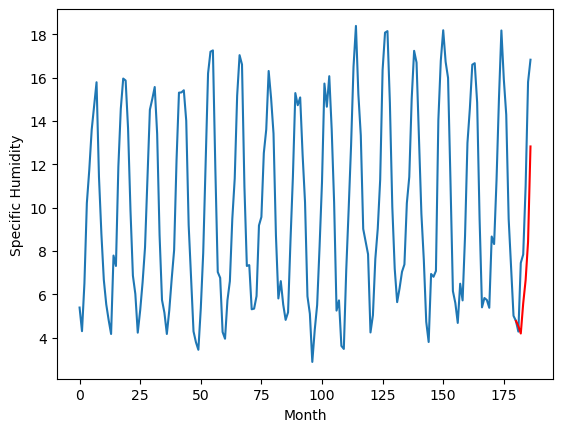

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.23		-0.67
5.61		3.88		-1.73
7.82		5.28		-2.54
8.04		6.35		-1.69
10.53		8.12		-2.41
15.28		12.52		-2.76
[180, 181, 182, 183, 184, 185, 186]
[7.05, 4.225427168607712, 3.881223726272583, 5.276179361343384, 6.349630761146545, 8.116061854362489, 12.516391921043397]


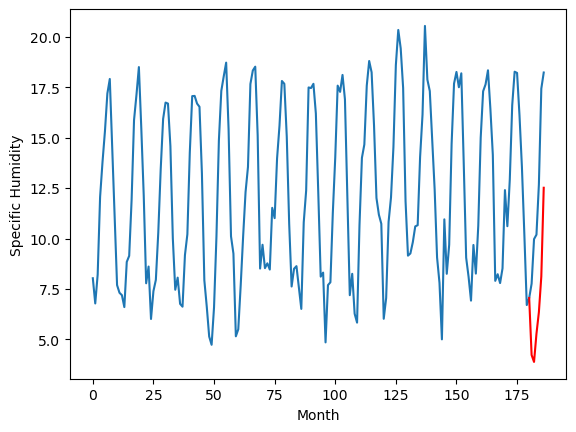

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.12		-0.70
4.97		3.77		-1.20
6.82		5.17		-1.65
7.06		6.24		-0.82
9.82		8.01		-1.81
14.44		12.41		-2.03
[180, 181, 182, 183, 184, 185, 186]
[5.06, 4.115427168607712, 3.7712237262725834, 5.166179361343384, 6.239630761146546, 8.006061854362489, 12.406391921043397]


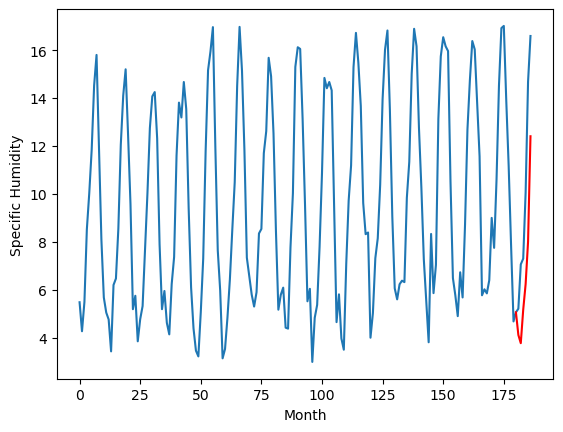

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		3.82		-0.39
4.12		3.47		-0.65
7.57		4.87		-2.70
8.14		5.94		-2.20
11.65		7.71		-3.94
15.55		12.11		-3.44
[180, 181, 182, 183, 184, 185, 186]
[7.05, 3.8154271686077115, 3.4712237262725827, 4.8661793613433835, 5.939630761146545, 7.7060618543624875, 12.106391921043397]


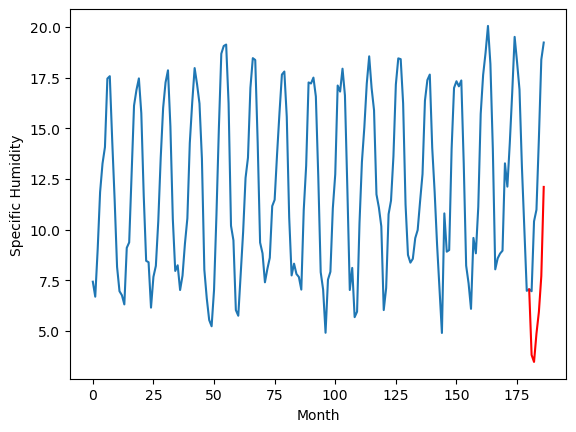

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.07		-0.25
4.92		4.72		-0.20
7.76		6.12		-1.64
9.16		7.19		-1.97
13.17		8.96		-4.21
16.86		13.36		-3.50
[180, 181, 182, 183, 184, 185, 186]
[5.2, 5.0654271686077115, 4.721223726272583, 6.1161793613433835, 7.189630761146545, 8.956061854362488, 13.356391921043397]


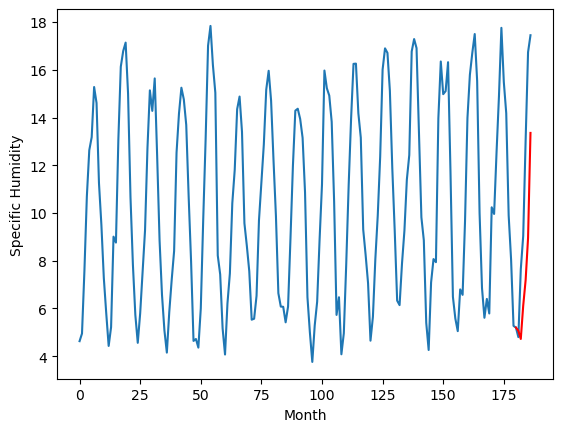

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.71		0.29
8.01		7.36		-0.65
9.58		8.76		-0.82
10.59		9.83		-0.76
13.09		11.60		-1.49
18.35		16.00		-2.35
[180, 181, 182, 183, 184, 185, 186]
[5.16, 7.705427168607711, 7.361223726272582, 8.756179361343383, 9.829630761146545, 11.596061854362487, 15.996391921043395]


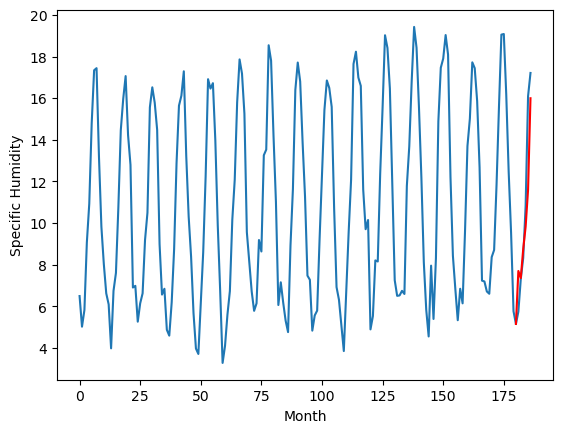

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.16		-0.17
5.38		4.81		-0.57
6.97		6.21		-0.76
7.57		7.28		-0.29
10.57		9.05		-1.52
14.95		13.45		-1.50
[180, 181, 182, 183, 184, 185, 186]
[4.05, 5.155427168607712, 4.811223726272583, 6.206179361343384, 7.279630761146546, 9.046061854362488, 13.446391921043396]


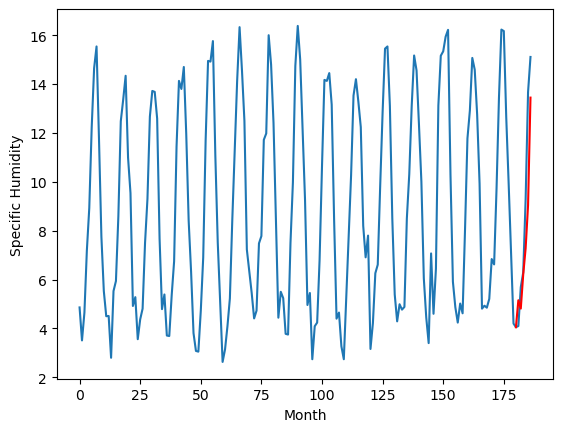

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.11		-0.01
7.15		6.76		-0.39
8.77		8.16		-0.61
9.47		9.23		-0.24
12.49		11.00		-1.49
16.76		15.40		-1.36
[180, 181, 182, 183, 184, 185, 186]
[3.64, 7.1054271686077115, 6.761223726272583, 8.156179361343384, 9.229630761146545, 10.996061854362488, 15.396391921043396]


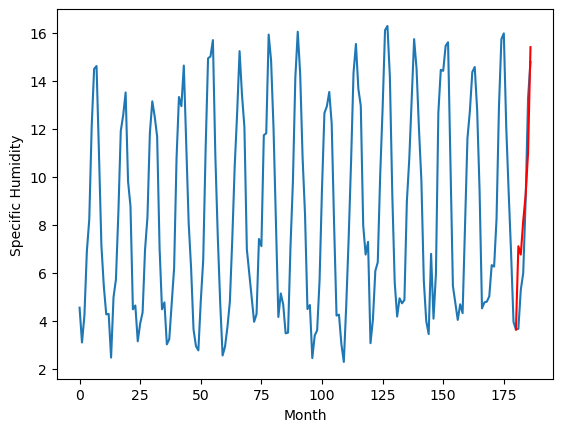

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.31		-0.09
3.72		3.96		0.24
6.78		5.36		-1.42
7.51		6.43		-1.08
10.42		8.20		-2.22
15.40		12.60		-2.80
[180, 181, 182, 183, 184, 185, 186]
[3.46, 4.305427168607712, 3.961223726272583, 5.356179361343384, 6.429630761146545, 8.196061854362487, 12.596391921043395]


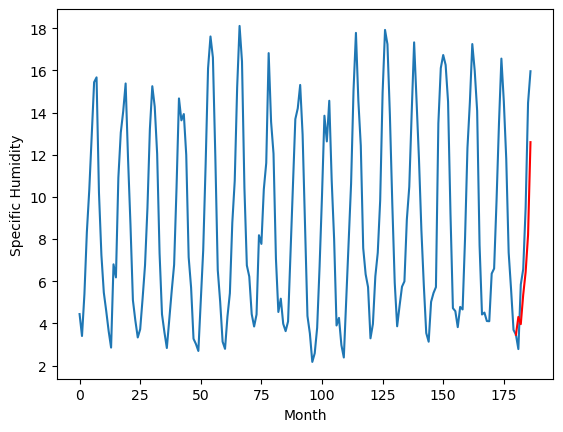

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.18		0.01
5.72		5.83		0.11
7.52		7.23		-0.29
8.84		8.30		-0.54
10.93		10.07		-0.86
15.70		14.47		-1.23
[180, 181, 182, 183, 184, 185, 186]
[2.93, 6.175427168607712, 5.831223726272583, 7.226179361343384, 8.299630761146545, 10.066061854362488, 14.466391921043396]


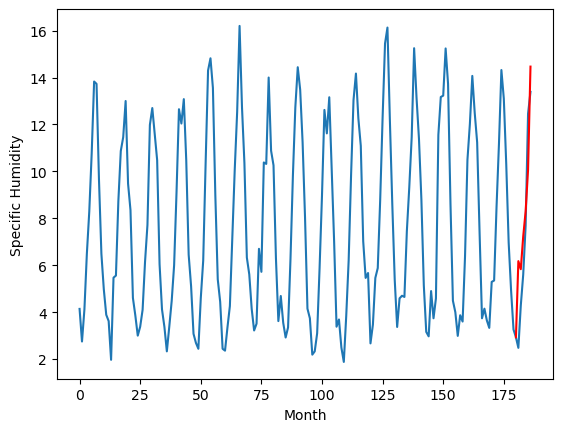

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.54		0.06
3.74		4.19		0.45
5.36		5.59		0.23
6.96		6.66		-0.30
8.48		8.43		-0.05
13.61		12.83		-0.78
[180, 181, 182, 183, 184, 185, 186]
[2.74, 4.535427168607712, 4.191223726272583, 5.586179361343384, 6.659630761146546, 8.426061854362487, 12.826391921043395]


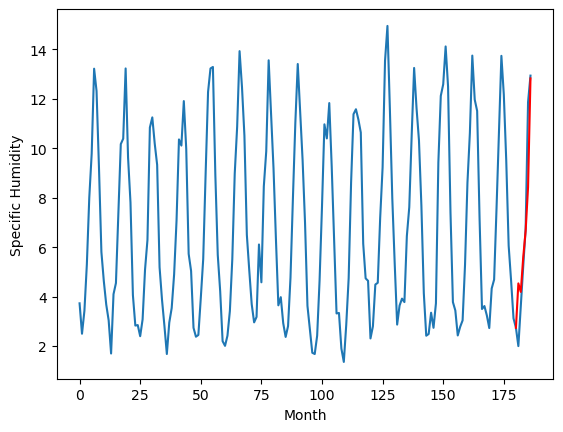

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.535427168607712, 4.225427168607712, 4.115427168607712, 3.8154271686077115, 5.0654271686077115, 7.705427168607711, 5.155427168607712, 7.1054271686077115, 4.305427168607712, 6.175427168607712, 4.535427168607712]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.535427
1                 1    4.90   4.225427
2                 2    4.82   4.115427
3                 3    4.21   3.815427
4                 4    5.32   5.065427
5                 5    7.42   7.705427
6                 6    5.33   5.155427
7                 7    7.12   7.105427
8                 8    4.40   4.305427
9                 9    6.17   6.175427
10               10    4.48   4.535427


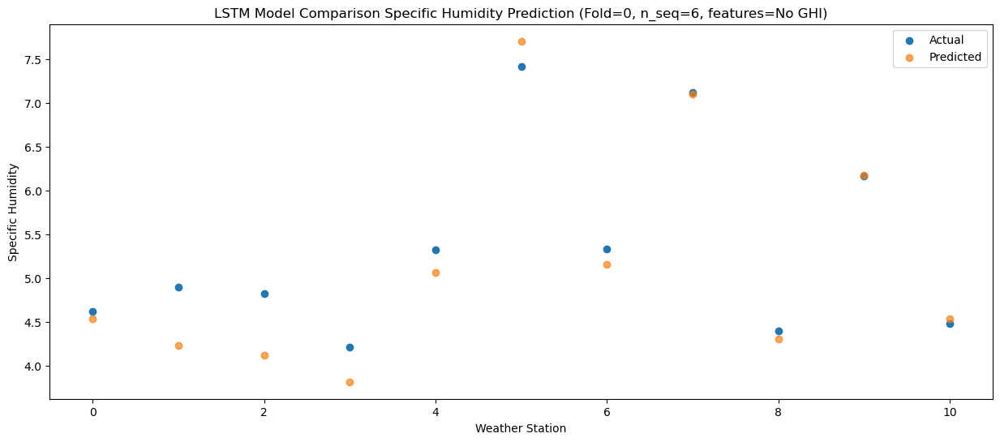

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   4.191224
1                 1    5.61   3.881224
2                 2    4.97   3.771224
3                 3    4.12   3.471224
4                 4    4.92   4.721224
5                 5    8.01   7.361224
6                 6    5.38   4.811224
7                 7    7.15   6.761224
8                 8    3.72   3.961224
9                 9    5.72   5.831224
10               10    3.74   4.191224


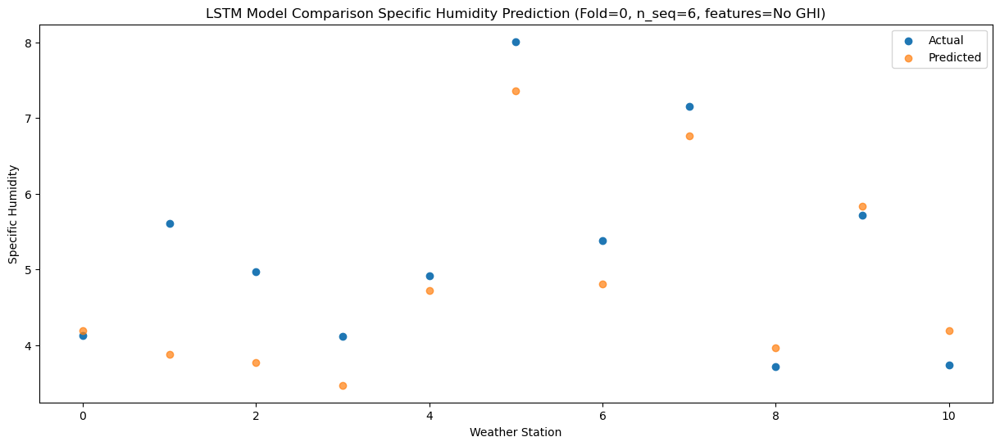

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   5.586179
1                 1    7.82   5.276179
2                 2    6.82   5.166179
3                 3    7.57   4.866179
4                 4    7.76   6.116179
5                 5    9.58   8.756179
6                 6    6.97   6.206179
7                 7    8.77   8.156179
8                 8    6.78   5.356179
9                 9    7.52   7.226179
10               10    5.36   5.586179


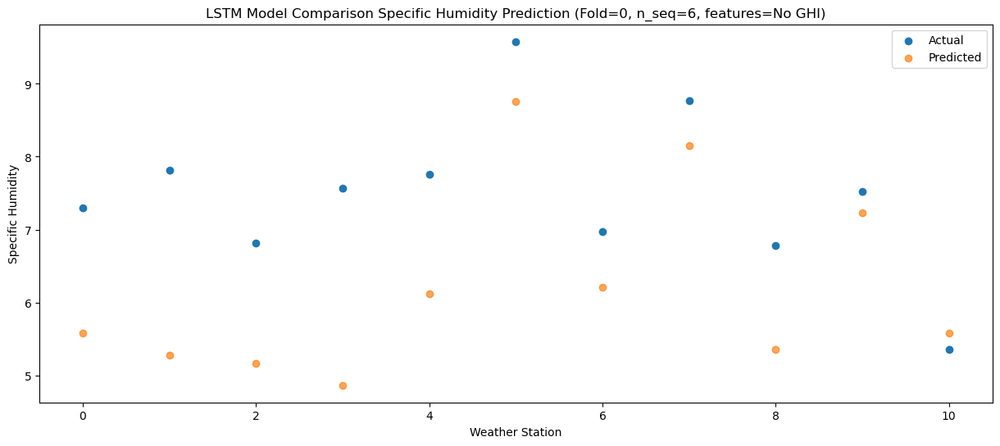

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   6.659631
1                 1    8.04   6.349631
2                 2    7.06   6.239631
3                 3    8.14   5.939631
4                 4    9.16   7.189631
5                 5   10.59   9.829631
6                 6    7.57   7.279631
7                 7    9.47   9.229631
8                 8    7.51   6.429631
9                 9    8.84   8.299631
10               10    6.96   6.659631


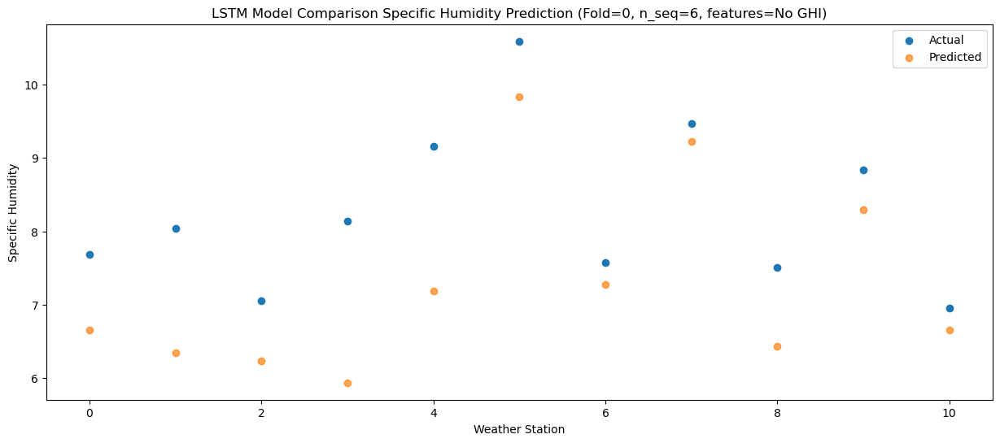

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84   8.426062
1                 1   10.53   8.116062
2                 2    9.82   8.006062
3                 3   11.65   7.706062
4                 4   13.17   8.956062
5                 5   13.09  11.596062
6                 6   10.57   9.046062
7                 7   12.49  10.996062
8                 8   10.42   8.196062
9                 9   10.93  10.066062
10               10    8.48   8.426062


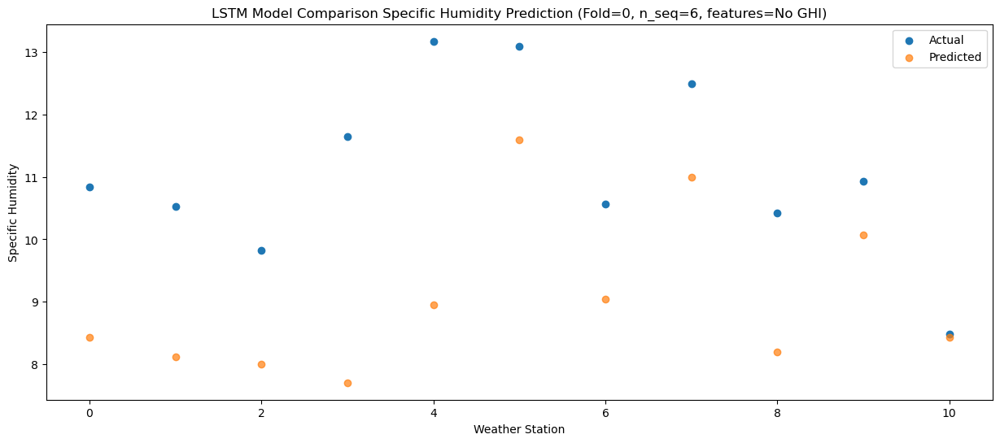

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  12.826392
1                 1   15.28  12.516392
2                 2   14.44  12.406392
3                 3   15.55  12.106392
4                 4   16.86  13.356392
5                 5   18.35  15.996392
6                 6   14.95  13.446392
7                 7   16.76  15.396392
8                 8   15.40  12.596392
9                 9   15.70  14.466392
10               10   13.61  12.826392


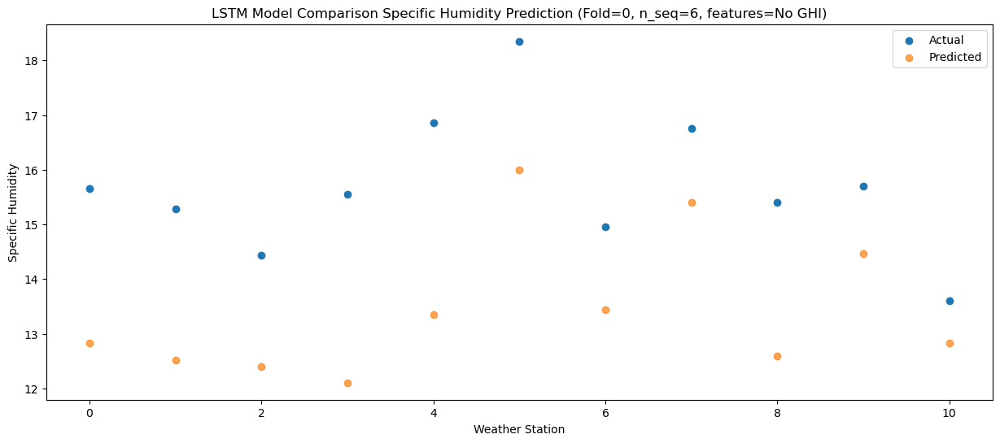

Model: "sequential_500"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1000 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1000 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1001 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1001 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1500 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1501 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1502 (Dense)          (1, 6)                 

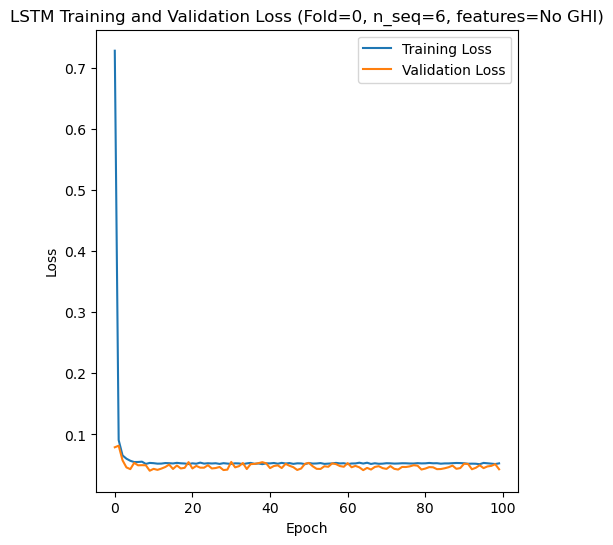

Epoch 1/100
84/84 [==============================] - 39s 286ms/step - loss: 0.5763 - val_loss: 0.0811
Epoch 2/100
84/84 [==============================] - 20s 236ms/step - loss: 0.0772 - val_loss: 0.0593
Epoch 3/100
84/84 [==============================] - 21s 246ms/step - loss: 0.0630 - val_loss: 0.0837
Epoch 4/100
84/84 [==============================] - 15s 174ms/step - loss: 0.0579 - val_loss: 0.0565
Epoch 5/100
84/84 [==============================] - 15s 177ms/step - loss: 0.0541 - val_loss: 0.0535
Epoch 6/100
84/84 [==============================] - 15s 180ms/step - loss: 0.0533 - val_loss: 0.0528
Epoch 7/100
84/84 [==============================] - 17s 199ms/step - loss: 0.0524 - val_loss: 0.0590
Epoch 8/100
84/84 [==============================] - 18s 219ms/step - loss: 0.0519 - val_loss: 0.0523
Epoch 9/100
84/84 [==============================] - 18s 219ms/step - loss: 0.0515 - val_loss: 0.0586
Epoch 10/100
84/84 [==============================] - 21s 251ms/step - loss: 0.052

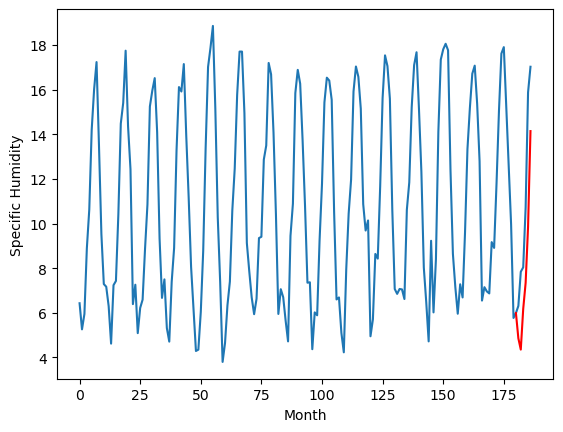

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.37		0.03
4.53		3.86		-0.67
6.06		5.69		-0.37
6.42		6.85		0.43
9.34		9.36		0.02
13.32		13.66		0.34
[180, 181, 182, 183, 184, 185, 186]
[4.15, 4.366979475766421, 3.8632647950947288, 5.685581918507815, 6.85372435644269, 9.362270231992007, 13.655669089108706]


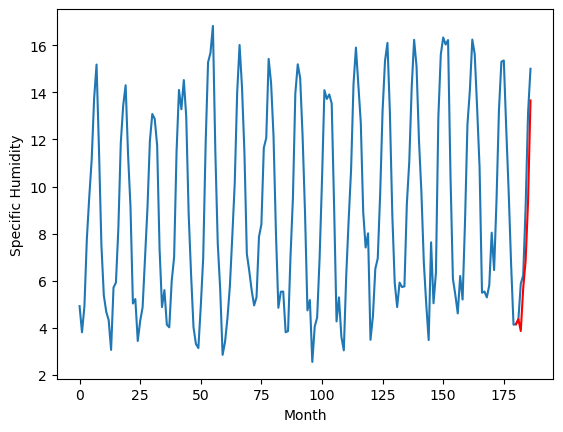

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		3.12		-0.10
3.22		2.61		-0.61
5.84		4.44		-1.40
5.55		5.60		0.05
8.39		8.11		-0.28
12.91		12.41		-0.50
[180, 181, 182, 183, 184, 185, 186]
[5.12, 3.11697947576642, 2.6132647950947283, 4.435581918507815, 5.60372435644269, 8.112270231992007, 12.405669089108706]


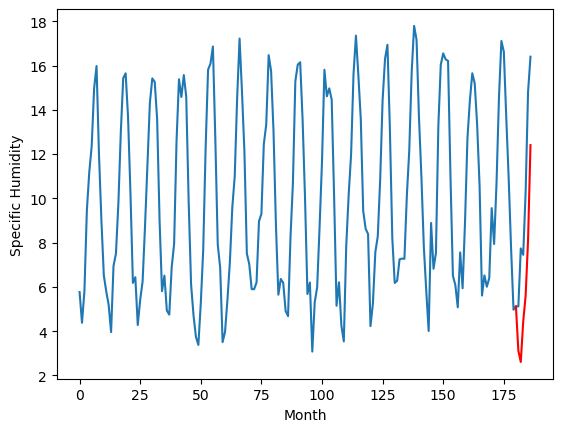

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.42		0.39
2.10		1.91		-0.19
4.74		3.74		-1.00
6.08		4.90		-1.18
9.97		7.41		-2.56
13.16		11.71		-1.45
[180, 181, 182, 183, 184, 185, 186]
[6.35, 2.4169794757664205, 1.9132647950947286, 3.7355819185078145, 4.90372435644269, 7.412270231992006, 11.705669089108707]


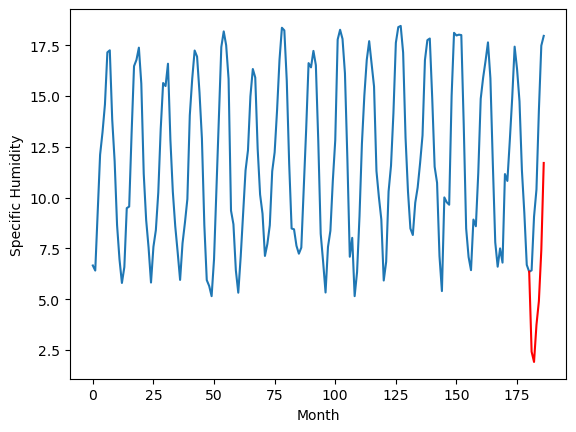

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.48		0.30
6.22		5.97		-0.25
8.94		7.80		-1.14
10.20		8.96		-1.24
14.23		11.47		-2.76
17.64		15.77		-1.87
[180, 181, 182, 183, 184, 185, 186]
[6.08, 6.47697947576642, 5.973264795094728, 7.795581918507814, 8.96372435644269, 11.472270231992006, 15.765669089108705]


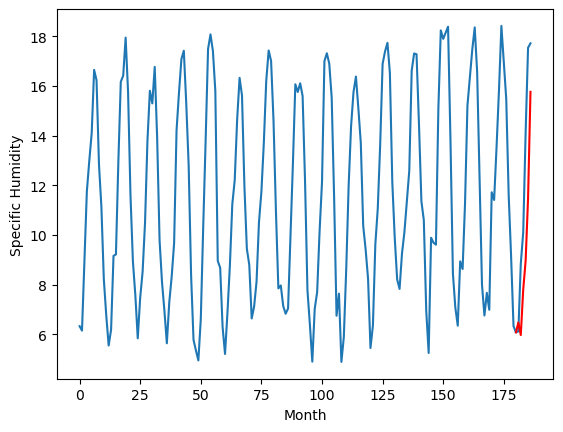

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.97		-0.78
5.12		4.46		-0.66
5.91		6.29		0.38
7.21		7.45		0.24
11.52		9.96		-1.56
13.69		14.26		0.57
[180, 181, 182, 183, 184, 185, 186]
[3.92, 4.96697947576642, 4.463264795094728, 6.285581918507814, 7.45372435644269, 9.962270231992006, 14.255669089108705]


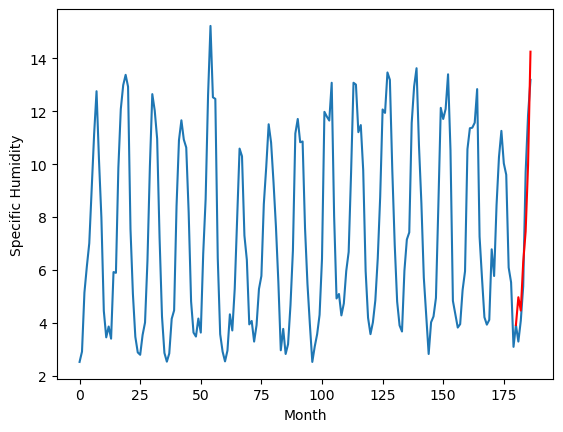

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.82		0.16
5.78		5.31		-0.47
7.34		7.14		-0.20
7.96		8.30		0.34
10.89		10.81		-0.08
15.24		15.11		-0.13
[180, 181, 182, 183, 184, 185, 186]
[4.16, 5.81697947576642, 5.313264795094728, 7.135581918507814, 8.30372435644269, 10.812270231992006, 15.105669089108705]


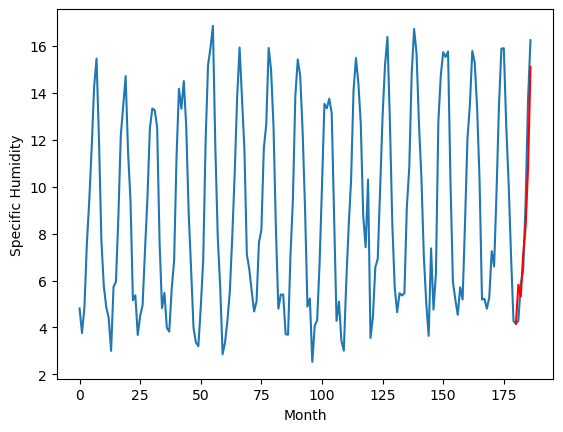

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.71		0.18
6.01		6.20		0.19
8.74		8.03		-0.71
9.97		9.19		-0.78
13.18		11.70		-1.48
17.94		16.00		-1.94
[180, 181, 182, 183, 184, 185, 186]
[3.84, 6.7069794757664205, 6.203264795094729, 8.025581918507815, 9.19372435644269, 11.702270231992006, 15.995669089108706]


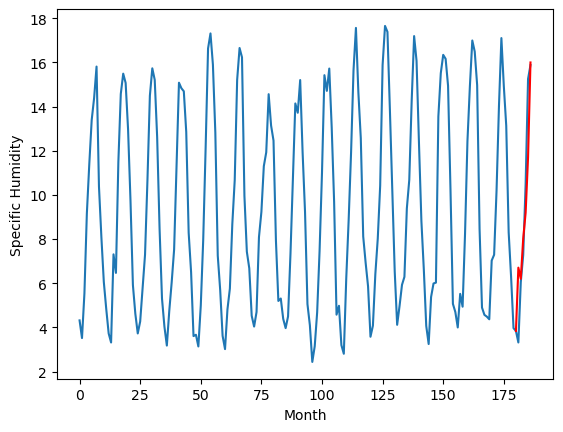

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.38		-0.11
5.68		5.87		0.19
8.29		7.70		-0.59
9.45		8.86		-0.59
13.67		11.37		-2.30
16.81		15.67		-1.14
[180, 181, 182, 183, 184, 185, 186]
[3.73, 6.37697947576642, 5.8732647950947285, 7.6955819185078145, 8.86372435644269, 11.372270231992006, 15.665669089108706]


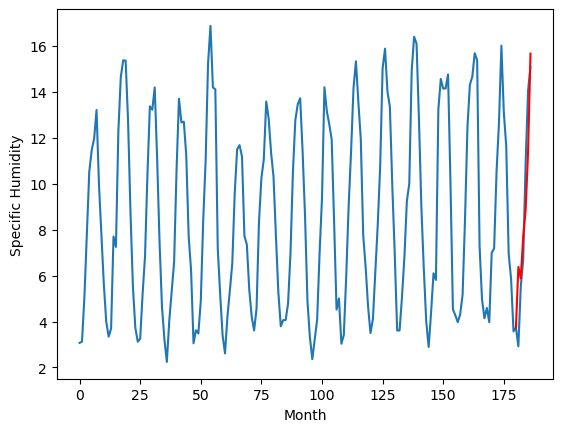

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.57		-0.14
1.97		2.06		0.09
3.79		3.89		0.10
3.96		5.05		1.09
9.11		7.56		-1.55
12.10		11.86		-0.24
[180, 181, 182, 183, 184, 185, 186]
[2.83, 2.5669794757664204, 2.0632647950947285, 3.8855819185078144, 5.0537243564426895, 7.562270231992006, 11.855669089108705]


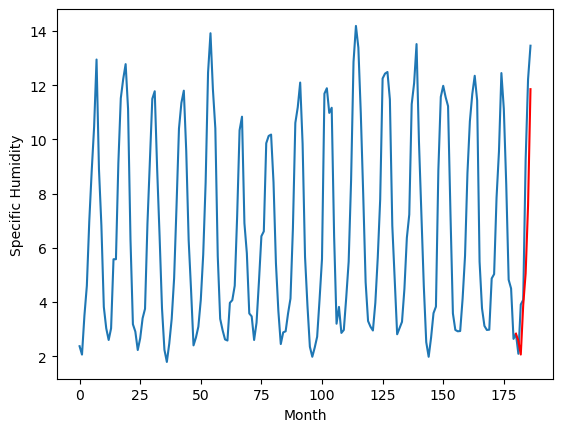

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.86		0.78
4.12		4.35		0.23
5.36		6.18		0.82
6.73		7.34		0.61
8.26		9.85		1.59
13.58		14.15		0.57
[180, 181, 182, 183, 184, 185, 186]
[2.69, 4.85697947576642, 4.353264795094728, 6.175581918507814, 7.3437243564426895, 9.852270231992005, 14.145669089108704]


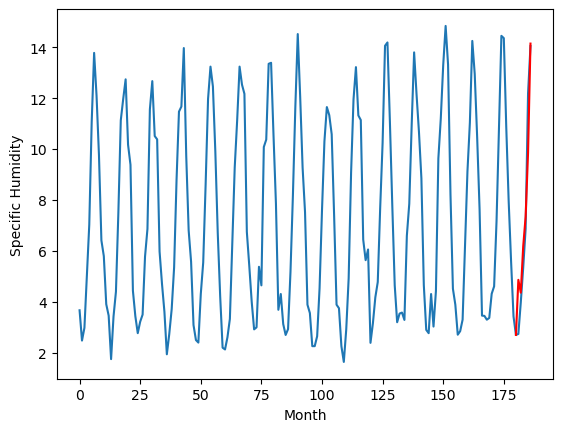

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.85697947576642, 4.366979475766421, 3.11697947576642, 2.4169794757664205, 6.47697947576642, 4.96697947576642, 5.81697947576642, 6.7069794757664205, 6.37697947576642, 2.5669794757664204, 4.85697947576642]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03   4.856979
1                 1    4.34   4.366979
2                 2    3.22   3.116979
3                 3    2.03   2.416979
4                 4    6.18   6.476979
5                 5    5.75   4.966979
6                 6    5.66   5.816979
7                 7    6.53   6.706979
8                 8    6.49   6.376979
9                 9    2.71   2.566979
10               10    4.08   4.856979


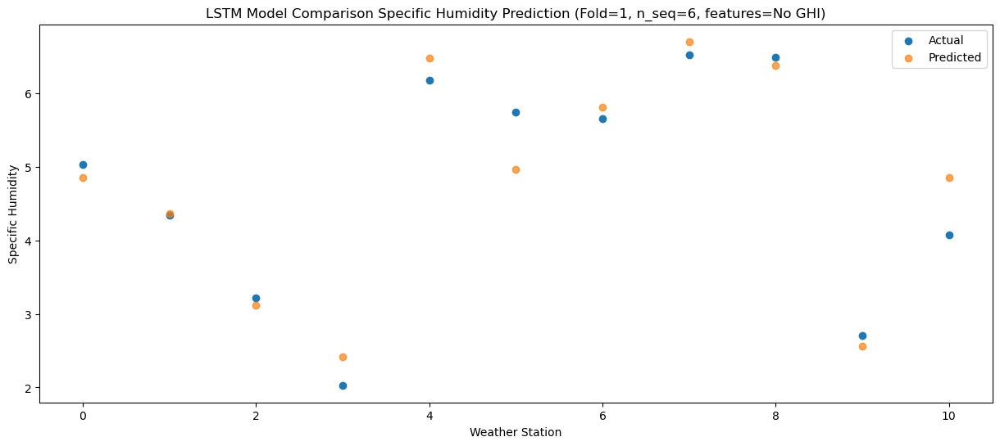

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35   4.353265
1                 1    4.53   3.863265
2                 2    3.22   2.613265
3                 3    2.10   1.913265
4                 4    6.22   5.973265
5                 5    5.12   4.463265
6                 6    5.78   5.313265
7                 7    6.01   6.203265
8                 8    5.68   5.873265
9                 9    1.97   2.063265
10               10    4.12   4.353265


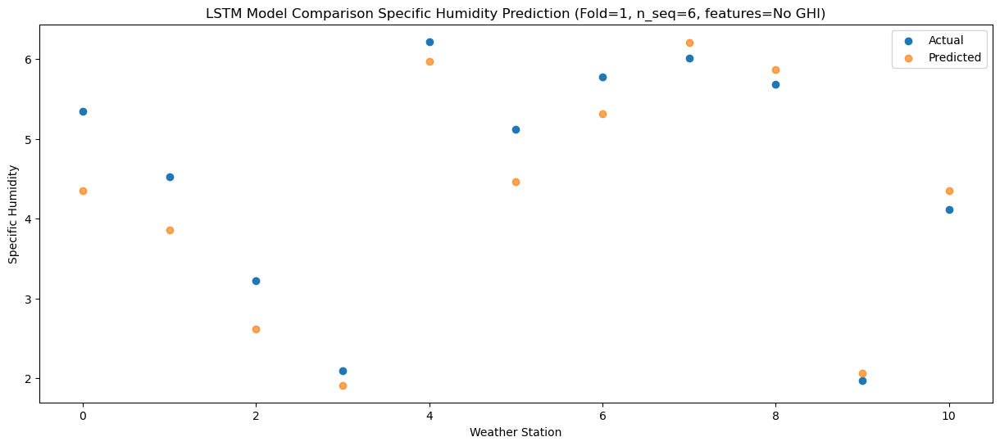

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   6.175582
1                 1    6.06   5.685582
2                 2    5.84   4.435582
3                 3    4.74   3.735582
4                 4    8.94   7.795582
5                 5    5.91   6.285582
6                 6    7.34   7.135582
7                 7    8.74   8.025582
8                 8    8.29   7.695582
9                 9    3.79   3.885582
10               10    5.36   6.175582


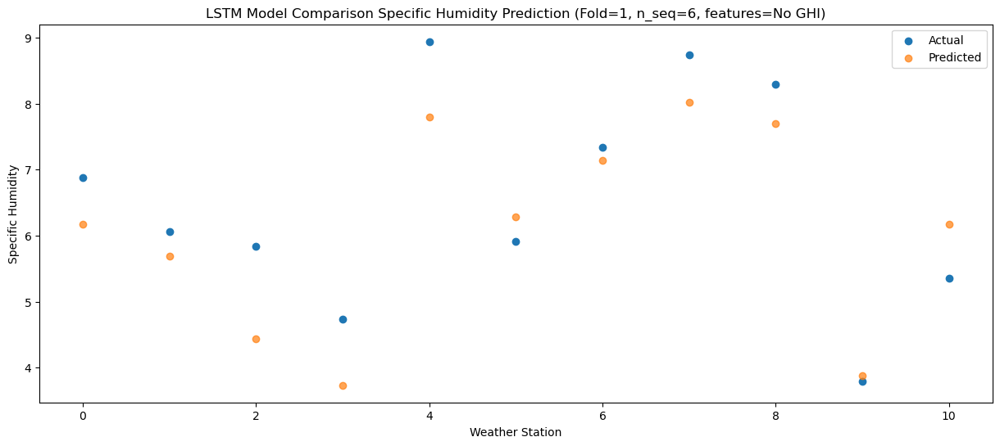

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   7.343724
1                 1    6.42   6.853724
2                 2    5.55   5.603724
3                 3    6.08   4.903724
4                 4   10.20   8.963724
5                 5    7.21   7.453724
6                 6    7.96   8.303724
7                 7    9.97   9.193724
8                 8    9.45   8.863724
9                 9    3.96   5.053724
10               10    6.73   7.343724


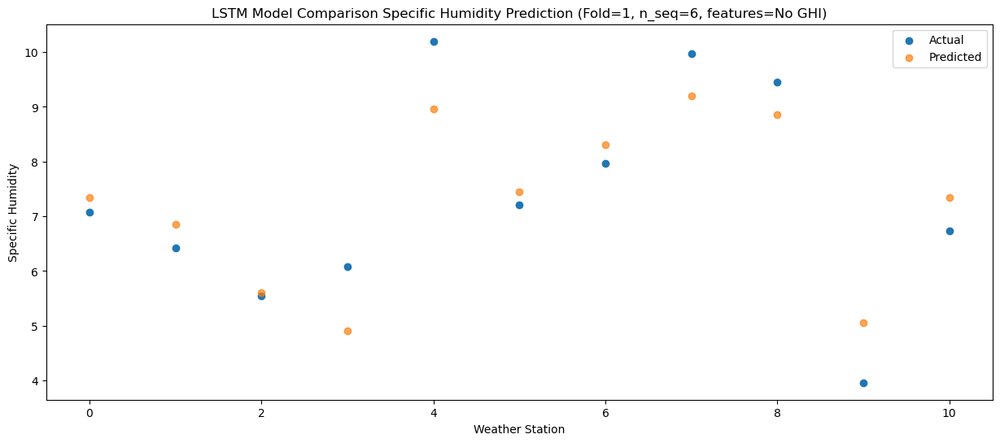

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76    9.85227
1                 1    9.34    9.36227
2                 2    8.39    8.11227
3                 3    9.97    7.41227
4                 4   14.23   11.47227
5                 5   11.52    9.96227
6                 6   10.89   10.81227
7                 7   13.18   11.70227
8                 8   13.67   11.37227
9                 9    9.11    7.56227
10               10    8.26    9.85227


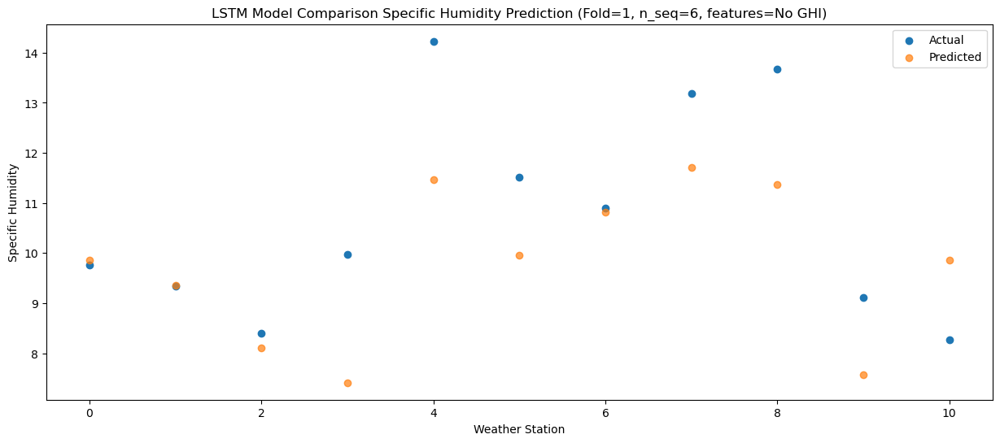

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92  14.145669
1                 1   13.32  13.655669
2                 2   12.91  12.405669
3                 3   13.16  11.705669
4                 4   17.64  15.765669
5                 5   13.69  14.255669
6                 6   15.24  15.105669
7                 7   17.94  15.995669
8                 8   16.81  15.665669
9                 9   12.10  11.855669
10               10   13.58  14.145669


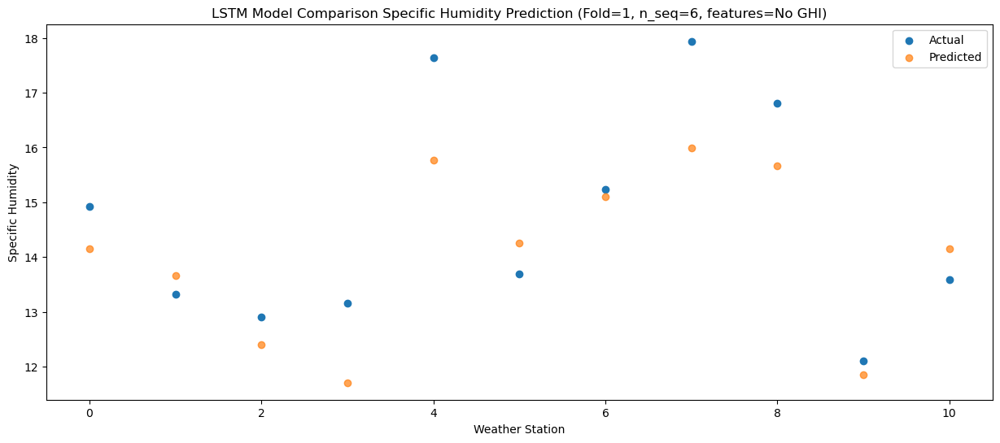

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1002 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1002 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1003 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1003 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1503 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1504 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1505 (Dense)          (1, 6)                 

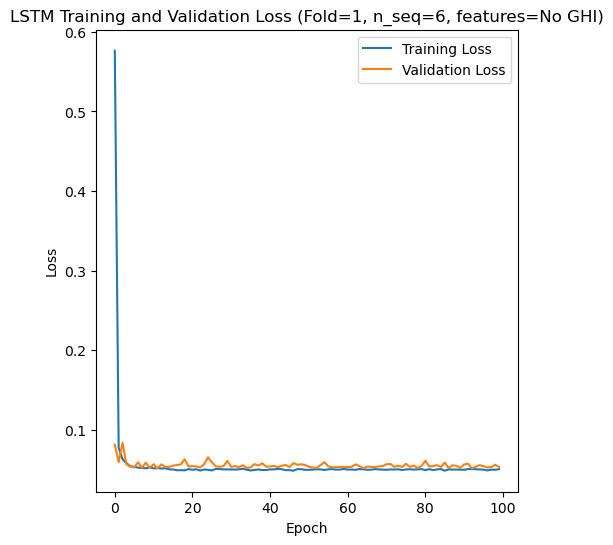

Epoch 1/100
84/84 [==============================] - 29s 199ms/step - loss: 0.9017 - val_loss: 0.0647
Epoch 2/100
84/84 [==============================] - 20s 244ms/step - loss: 0.0791 - val_loss: 0.0420
Epoch 3/100
84/84 [==============================] - 22s 261ms/step - loss: 0.0702 - val_loss: 0.0669
Epoch 4/100
84/84 [==============================] - 21s 246ms/step - loss: 0.0600 - val_loss: 0.0596
Epoch 5/100
84/84 [==============================] - 23s 280ms/step - loss: 0.0614 - val_loss: 0.0336
Epoch 6/100
84/84 [==============================] - 22s 256ms/step - loss: 0.0558 - val_loss: 0.0505
Epoch 7/100
84/84 [==============================] - 21s 254ms/step - loss: 0.0580 - val_loss: 0.0447
Epoch 8/100
84/84 [==============================] - 23s 273ms/step - loss: 0.0558 - val_loss: 0.0393
Epoch 9/100
84/84 [==============================] - 21s 255ms/step - loss: 0.0550 - val_loss: 0.0554
Epoch 10/100
84/84 [==============================] - 20s 234ms/step - loss: 0.054

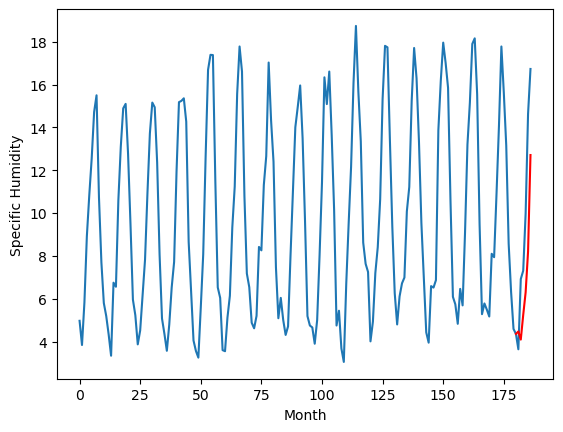

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		1.74		-0.10
1.16		1.36		0.20
3.01		2.51		-0.50
3.13		3.57		0.44
8.25		5.47		-2.78
11.16		9.98		-1.18
[180, 181, 182, 183, 184, 185, 186]
[2.82, 1.7412645661830901, 1.362105711698532, 2.511130436658859, 3.5692803704738614, 5.471843942403793, 9.98131345152855]


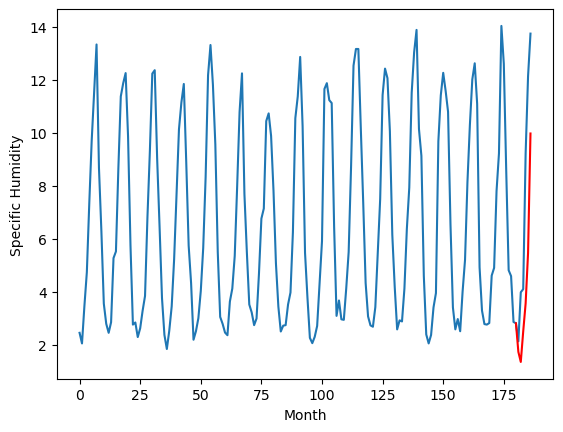

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		4.89		-0.64
7.66		4.51		-3.15
7.88		5.66		-2.22
8.85		6.72		-2.13
10.16		8.62		-1.54
13.94		13.13		-0.81
[180, 181, 182, 183, 184, 185, 186]
[9.16, 4.89126456618309, 4.512105711698532, 5.661130436658859, 6.719280370473862, 8.621843942403792, 13.131313451528548]


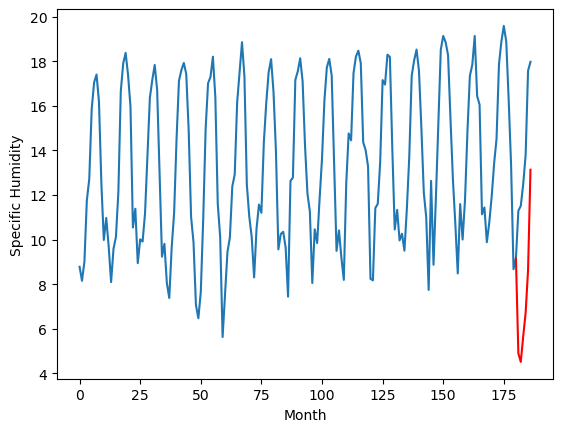

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		4.91		0.93
4.15		4.53		0.38
4.79		5.68		0.89
6.14		6.74		0.60
7.82		8.64		0.82
12.42		13.15		0.73
[180, 181, 182, 183, 184, 185, 186]
[2.44, 4.91126456618309, 4.532105711698532, 5.681130436658859, 6.739280370473861, 8.641843942403792, 13.151313451528548]


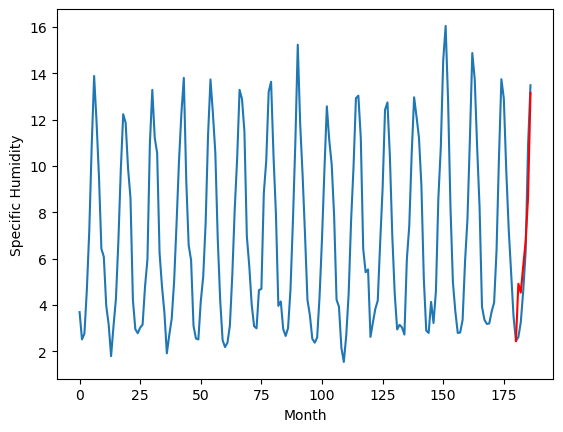

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		4.82		-0.28
5.08		4.44		-0.64
8.37		5.59		-2.78
8.39		6.65		-1.74
11.59		8.55		-3.04
15.48		13.06		-2.42
[180, 181, 182, 183, 184, 185, 186]
[6.65, 4.82126456618309, 4.442105711698532, 5.591130436658859, 6.6492803704738614, 8.551843942403792, 13.061313451528548]


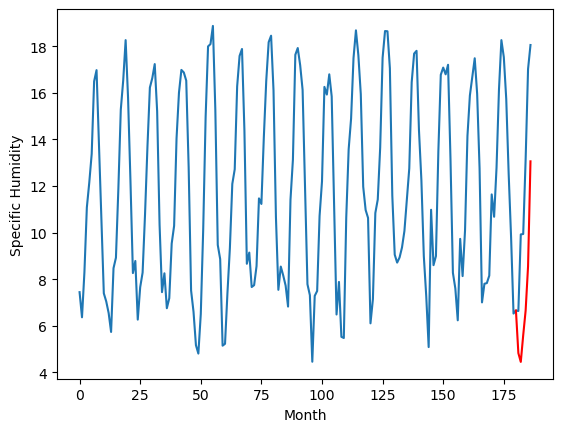

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.31		-0.02
2.28		1.93		-0.35
5.27		3.08		-2.19
6.84		4.14		-2.70
11.67		6.04		-5.63
14.31		10.55		-3.76
[180, 181, 182, 183, 184, 185, 186]
[6.19, 2.31126456618309, 1.932105711698532, 3.081130436658859, 4.139280370473862, 6.041843942403793, 10.55131345152855]


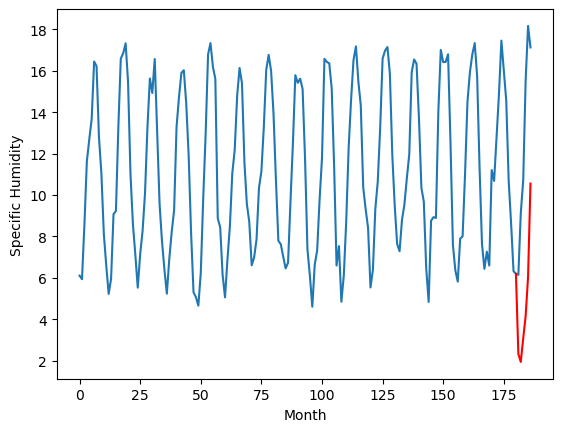

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.63		-0.05
8.35		8.25		-0.10
11.21		9.40		-1.81
12.53		10.46		-2.07
16.73		12.36		-4.37
20.48		16.87		-3.61
[180, 181, 182, 183, 184, 185, 186]
[4.78, 8.63126456618309, 8.252105711698531, 9.401130436658859, 10.459280370473861, 12.361843942403793, 16.87131345152855]


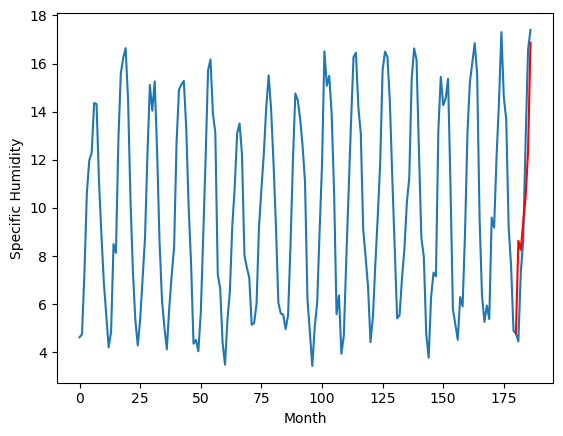

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.54		-0.43
3.84		3.16		-0.68
3.93		4.31		0.38
4.23		5.37		1.14
4.35		7.27		2.92
7.01		11.78		4.77
[180, 181, 182, 183, 184, 185, 186]
[2.61, 3.54126456618309, 3.162105711698532, 4.311130436658859, 5.369280370473861, 7.271843942403793, 11.781313451528549]


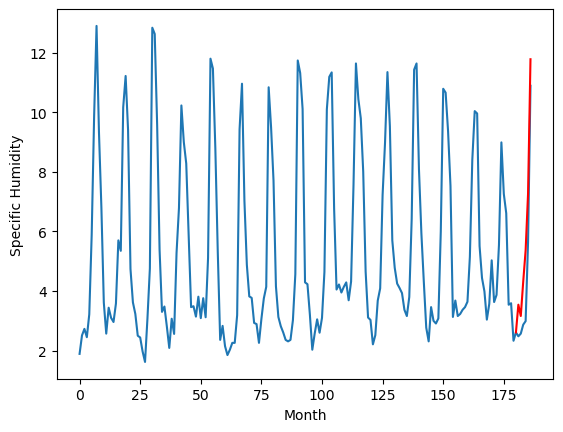

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.29		-1.00
8.82		6.91		-1.91
8.93		8.06		-0.87
10.25		9.12		-1.13
11.73		11.02		-0.71
12.98		15.53		2.55
[180, 181, 182, 183, 184, 185, 186]
[4.6, 7.291264566183091, 6.9121057116985325, 8.06113043665886, 9.119280370473863, 11.021843942403795, 15.53131345152855]


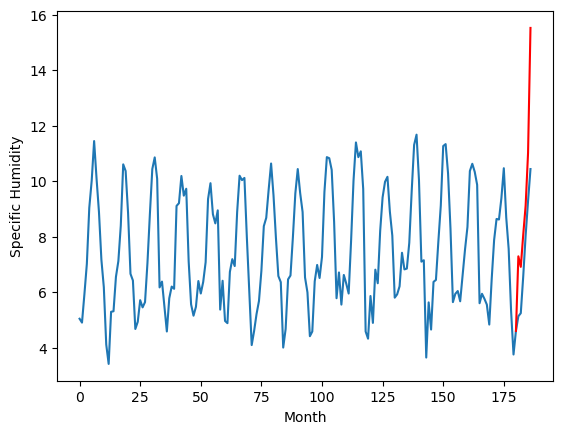

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		5.95		-0.03
6.05		5.57		-0.48
7.78		6.72		-1.06
8.31		7.78		-0.53
11.02		9.68		-1.34
15.52		14.19		-1.33
[180, 181, 182, 183, 184, 185, 186]
[4.27, 5.95126456618309, 5.572105711698532, 6.721130436658859, 7.779280370473861, 9.681843942403793, 14.191313451528549]


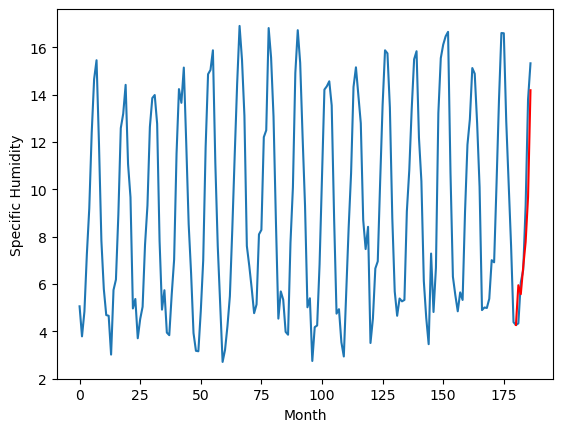

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.47		-0.16
4.87		4.09		-0.78
5.90		5.24		-0.66
6.51		6.30		-0.21
9.18		8.20		-0.98
13.28		12.71		-0.57
[180, 181, 182, 183, 184, 185, 186]
[3.91, 4.47126456618309, 4.092105711698532, 5.241130436658859, 6.299280370473862, 8.201843942403794, 12.71131345152855]


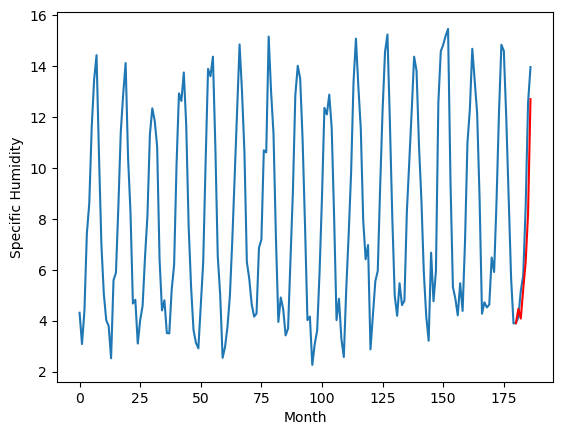

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.47126456618309, 1.7412645661830901, 4.89126456618309, 4.91126456618309, 4.82126456618309, 2.31126456618309, 8.63126456618309, 3.54126456618309, 7.291264566183091, 5.95126456618309, 4.47126456618309]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.471265
1                 1    1.84   1.741265
2                 2    5.53   4.891265
3                 3    3.98   4.911265
4                 4    5.10   4.821265
5                 5    2.33   2.311265
6                 6    8.68   8.631265
7                 7    3.97   3.541265
8                 8    8.29   7.291265
9                 9    5.98   5.951265
10               10    4.63   4.471265


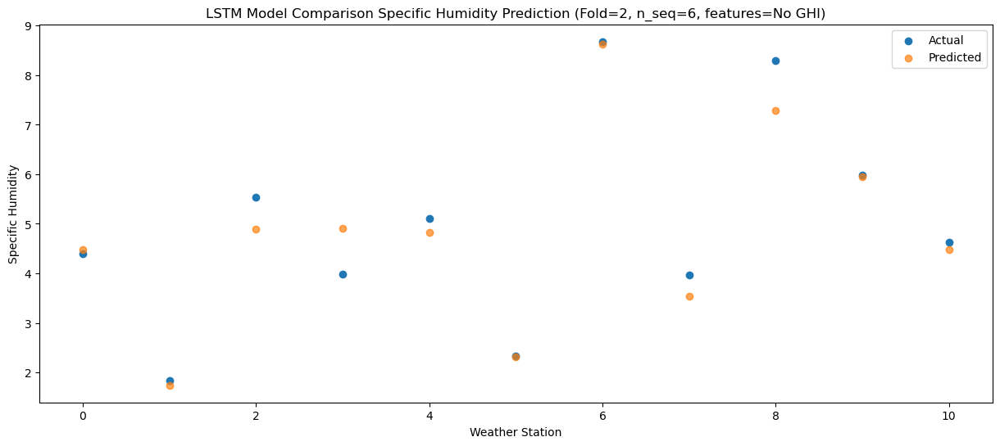

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   4.092106
1                 1    1.16   1.362106
2                 2    7.66   4.512106
3                 3    4.15   4.532106
4                 4    5.08   4.442106
5                 5    2.28   1.932106
6                 6    8.35   8.252106
7                 7    3.84   3.162106
8                 8    8.82   6.912106
9                 9    6.05   5.572106
10               10    4.87   4.092106


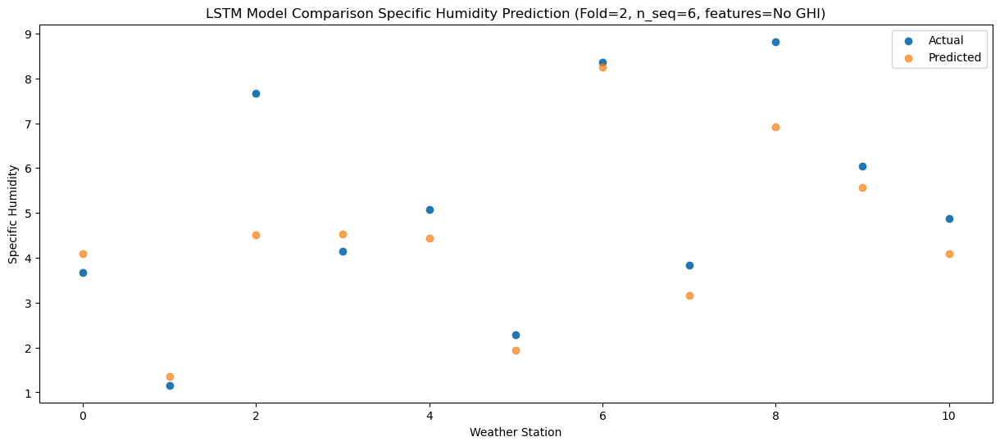

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95    5.24113
1                 1    3.01    2.51113
2                 2    7.88    5.66113
3                 3    4.79    5.68113
4                 4    8.37    5.59113
5                 5    5.27    3.08113
6                 6   11.21    9.40113
7                 7    3.93    4.31113
8                 8    8.93    8.06113
9                 9    7.78    6.72113
10               10    5.90    5.24113


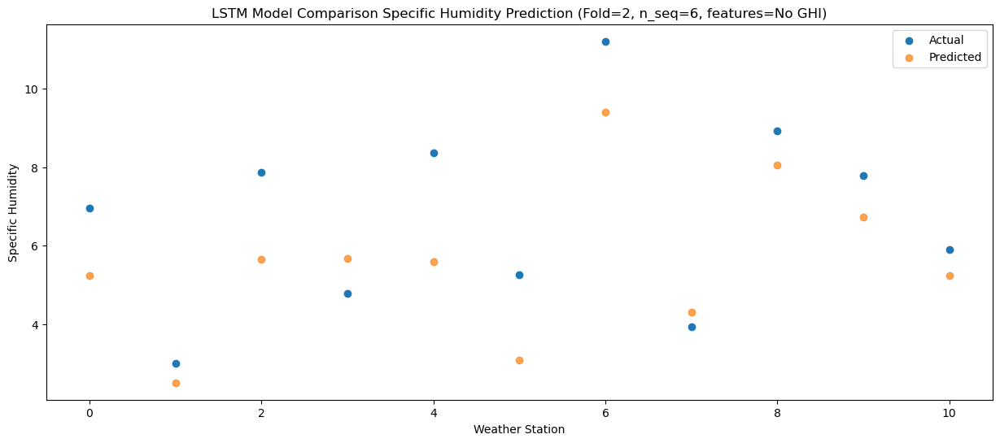

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34    6.29928
1                 1    3.13    3.56928
2                 2    8.85    6.71928
3                 3    6.14    6.73928
4                 4    8.39    6.64928
5                 5    6.84    4.13928
6                 6   12.53   10.45928
7                 7    4.23    5.36928
8                 8   10.25    9.11928
9                 9    8.31    7.77928
10               10    6.51    6.29928


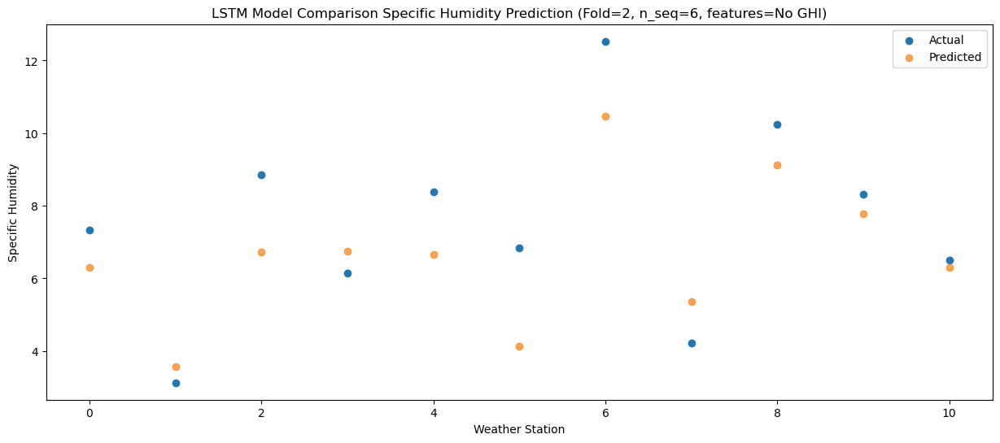

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01   8.201844
1                 1    8.25   5.471844
2                 2   10.16   8.621844
3                 3    7.82   8.641844
4                 4   11.59   8.551844
5                 5   11.67   6.041844
6                 6   16.73  12.361844
7                 7    4.35   7.271844
8                 8   11.73  11.021844
9                 9   11.02   9.681844
10               10    9.18   8.201844


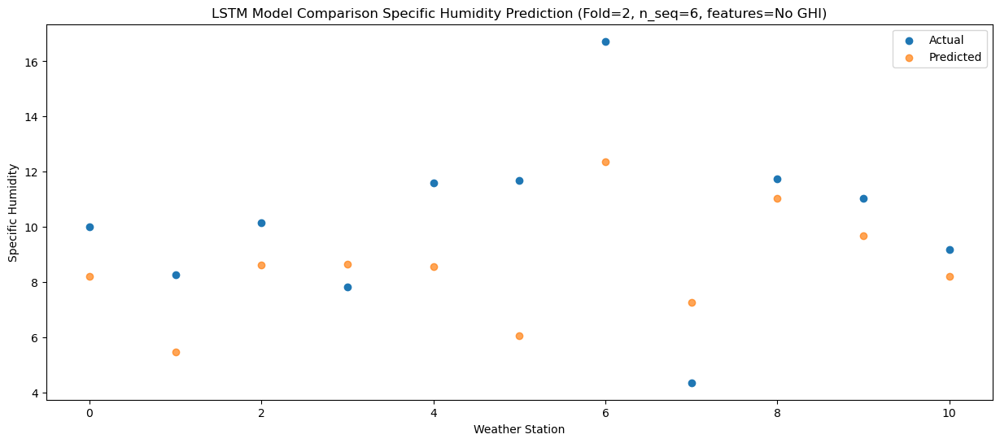

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  12.711313
1                 1   11.16   9.981313
2                 2   13.94  13.131313
3                 3   12.42  13.151313
4                 4   15.48  13.061313
5                 5   14.31  10.551313
6                 6   20.48  16.871313
7                 7    7.01  11.781313
8                 8   12.98  15.531313
9                 9   15.52  14.191313
10               10   13.28  12.711313


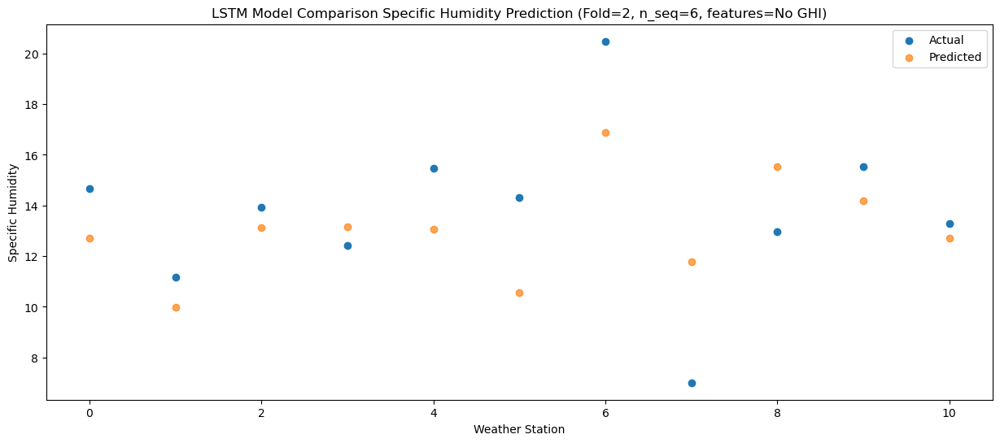

Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1004 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1004 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1005 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1005 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1506 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1507 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1508 (Dense)          (1, 6)                 

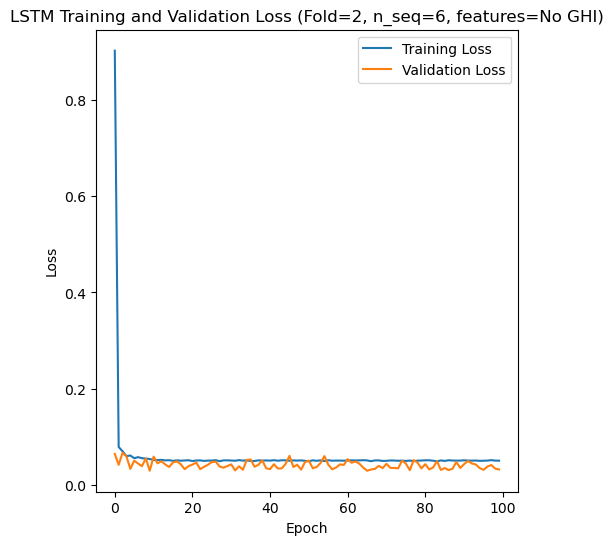

Epoch 1/100
84/84 [==============================] - 42s 291ms/step - loss: 0.8781 - val_loss: 0.0552
Epoch 2/100
84/84 [==============================] - 18s 217ms/step - loss: 0.0944 - val_loss: 0.0806
Epoch 3/100
84/84 [==============================] - 18s 209ms/step - loss: 0.0614 - val_loss: 0.0494
Epoch 4/100
84/84 [==============================] - 19s 227ms/step - loss: 0.0642 - val_loss: 0.0731
Epoch 5/100
84/84 [==============================] - 20s 239ms/step - loss: 0.0545 - val_loss: 0.0457
Epoch 6/100
84/84 [==============================] - 20s 235ms/step - loss: 0.0544 - val_loss: 0.0516
Epoch 7/100
84/84 [==============================] - 17s 208ms/step - loss: 0.0541 - val_loss: 0.0987
Epoch 8/100
84/84 [==============================] - 20s 244ms/step - loss: 0.0531 - val_loss: 0.0528
Epoch 9/100
84/84 [==============================] - 18s 211ms/step - loss: 0.0519 - val_loss: 0.0541
Epoch 10/100
84/84 [==============================] - 18s 210ms/step - loss: 0.053

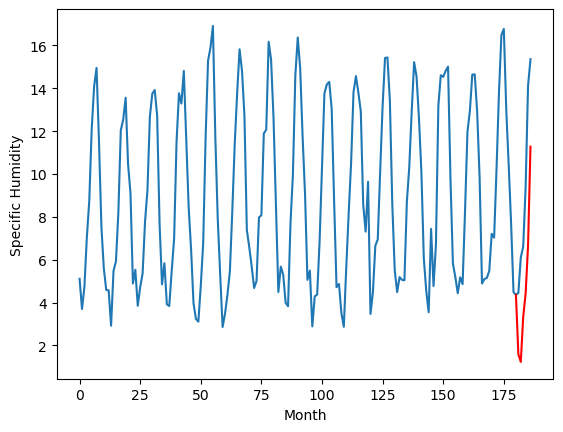

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.63		-0.01
2.08		2.27		0.19
4.59		4.37		-0.22
5.76		5.47		-0.29
9.28		7.70		-1.58
13.81		12.32		-1.49
[180, 181, 182, 183, 184, 185, 186]
[3.43, 2.632354374527931, 2.271494145989418, 4.365447755455971, 5.467123504281044, 7.699256177544594, 12.316897149682045]


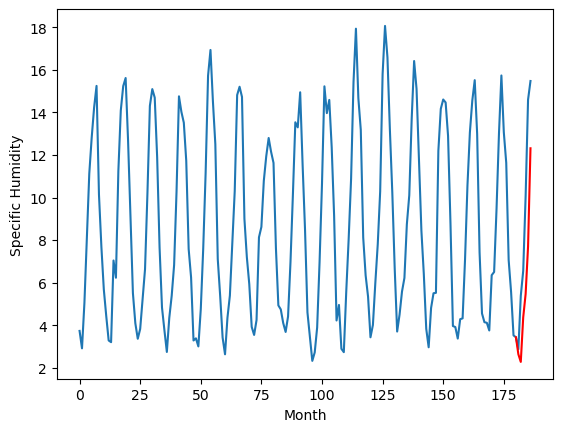

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		5.83		-0.54
6.31		5.47		-0.84
6.39		7.57		1.18
7.01		8.67		1.66
7.41		10.90		3.49
9.86		15.52		5.66
[180, 181, 182, 183, 184, 185, 186]
[5.43, 5.832354374527931, 5.471494145989418, 7.5654477554559705, 8.667123504281044, 10.899256177544594, 15.516897149682045]


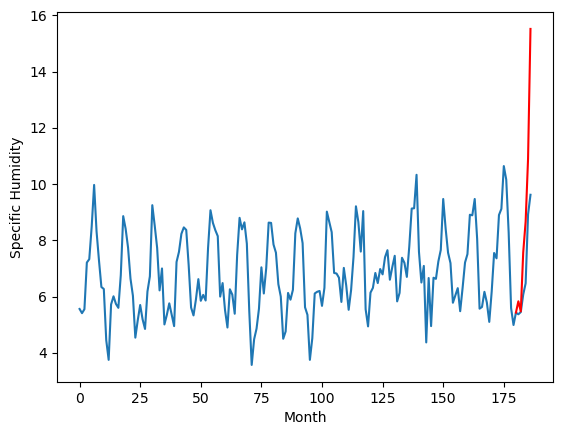

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.61		0.17
3.37		3.25		-0.12
4.67		5.35		0.68
5.86		6.45		0.59
8.39		8.68		0.29
13.81		13.30		-0.51
[180, 181, 182, 183, 184, 185, 186]
[3.21, 3.612354374527931, 3.251494145989418, 5.345447755455971, 6.447123504281044, 8.679256177544595, 13.296897149682046]


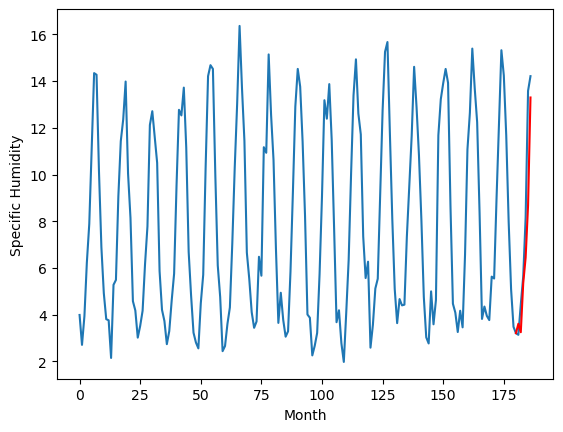

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		5.01		0.10
4.08		4.65		0.57
6.56		6.75		0.19
7.62		7.85		0.23
10.04		10.08		0.04
14.50		14.70		0.20
[180, 181, 182, 183, 184, 185, 186]
[3.04, 5.0123543745279315, 4.651494145989418, 6.745447755455971, 7.847123504281044, 10.079256177544593, 14.696897149682044]


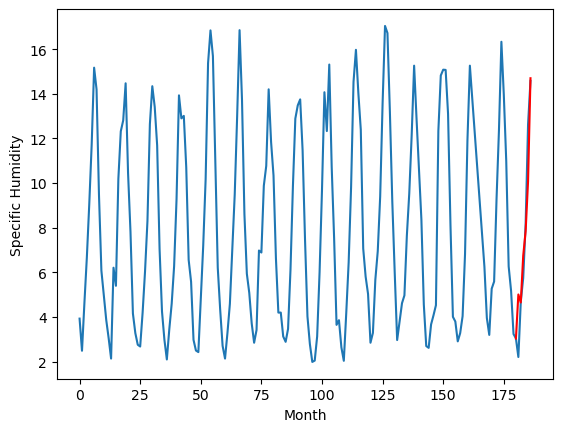

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.63		0.21
2.90		3.27		0.37
4.93		5.37		0.44
6.23		6.47		0.24
8.47		8.70		0.23
13.69		13.32		-0.37
[180, 181, 182, 183, 184, 185, 186]
[2.91, 3.632354374527931, 3.271494145989418, 5.365447755455971, 6.467123504281044, 8.699256177544594, 13.316897149682045]


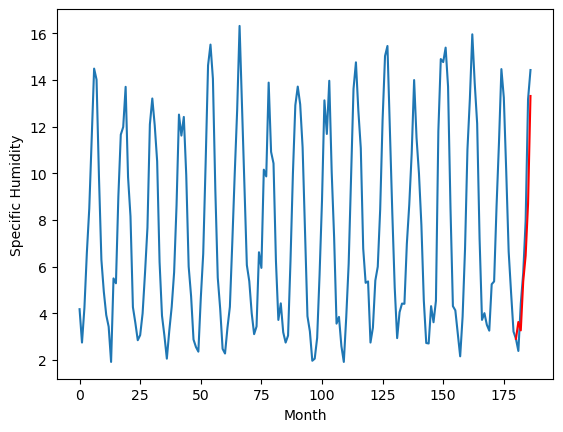

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.46		-0.27
5.79		5.10		-0.69
6.10		7.20		1.10
6.57		8.30		1.73
7.97		10.53		2.56
9.30		15.15		5.85
[180, 181, 182, 183, 184, 185, 186]
[1.6, 5.462354374527931, 5.101494145989418, 7.19544775545597, 8.297123504281043, 10.529256177544593, 15.146897149682044]


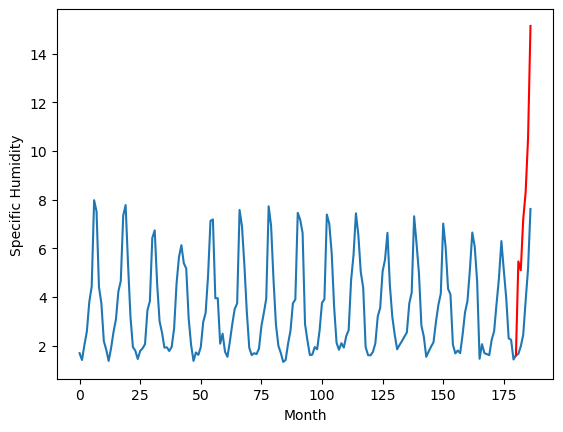

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		3.89		-0.91
4.32		3.53		-0.79
4.62		5.63		1.01
4.31		6.73		2.42
4.87		8.96		4.09
6.29		13.58		7.29
[180, 181, 182, 183, 184, 185, 186]
[2.86, 3.8923543745279314, 3.5314941459894182, 5.625447755455971, 6.727123504281044, 8.959256177544594, 13.576897149682045]


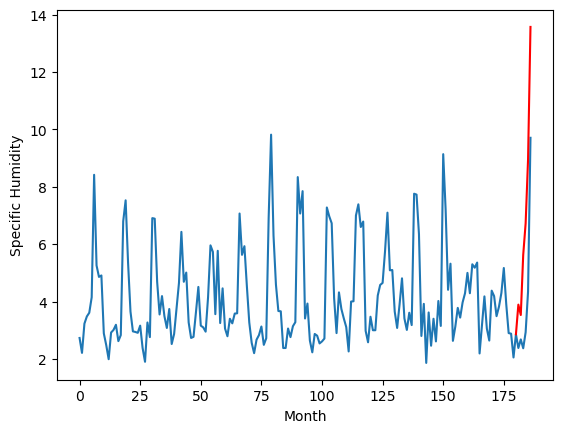

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		3.83		-0.77
4.25		3.47		-0.78
3.90		5.57		1.67
4.83		6.67		1.84
5.27		8.90		3.63
6.70		13.52		6.82
[180, 181, 182, 183, 184, 185, 186]
[5.65, 3.8323543745279314, 3.471494145989418, 5.5654477554559705, 6.667123504281044, 8.899256177544594, 13.516897149682045]


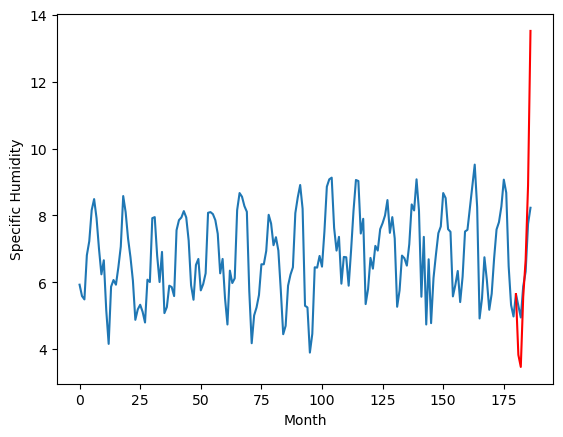

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		4.08		0.99
3.24		3.72		0.48
4.02		5.82		1.80
5.40		6.92		1.52
6.97		9.15		2.18
11.87		13.77		1.90
[180, 181, 182, 183, 184, 185, 186]
[2.54, 4.082354374527931, 3.7214941459894177, 5.8154477554559705, 6.917123504281044, 9.149256177544594, 13.766897149682045]


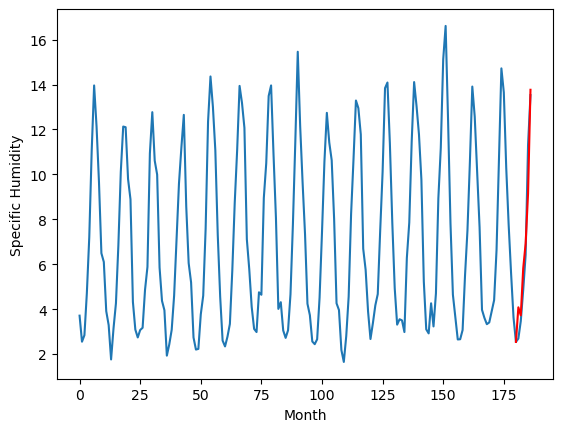

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.59		0.59
0.86		1.23		0.37
2.14		3.33		1.19
3.55		4.43		0.88
5.14		6.66		1.52
10.01		11.28		1.27
[180, 181, 182, 183, 184, 185, 186]
[2.51, 1.5923543745279312, 1.231494145989418, 3.3254477554559707, 4.4271235042810435, 6.659256177544593, 11.276897149682044]


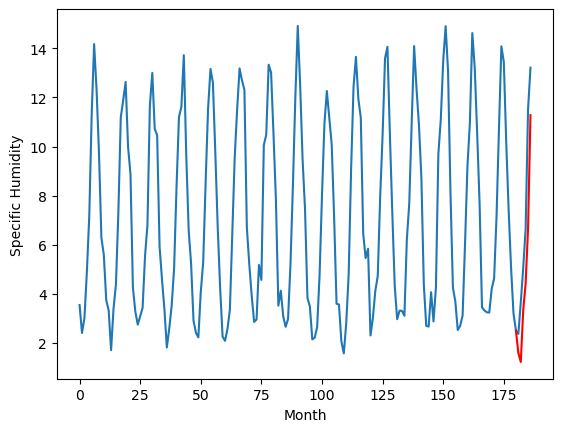

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.5923543745279312, 2.632354374527931, 5.832354374527931, 3.612354374527931, 5.0123543745279315, 3.632354374527931, 5.462354374527931, 3.8923543745279314, 3.8323543745279314, 4.082354374527931, 1.5923543745279312]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.592354
1                 1    2.64   2.632354
2                 2    6.37   5.832354
3                 3    3.44   3.612354
4                 4    4.91   5.012354
5                 5    3.42   3.632354
6                 6    5.73   5.462354
7                 7    4.80   3.892354
8                 8    4.60   3.832354
9                 9    3.09   4.082354
10               10    1.00   1.592354


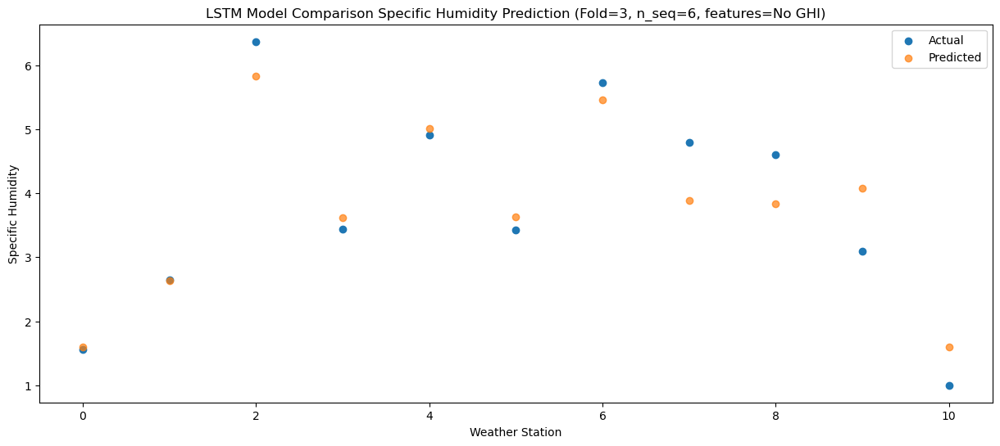

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.231494
1                 1    2.08   2.271494
2                 2    6.31   5.471494
3                 3    3.37   3.251494
4                 4    4.08   4.651494
5                 5    2.90   3.271494
6                 6    5.79   5.101494
7                 7    4.32   3.531494
8                 8    4.25   3.471494
9                 9    3.24   3.721494
10               10    0.86   1.231494


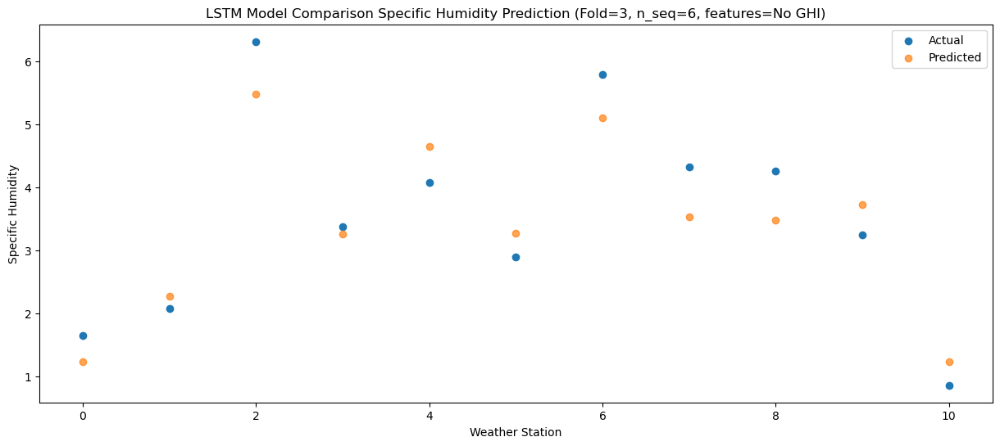

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   3.325448
1                 1    4.59   4.365448
2                 2    6.39   7.565448
3                 3    4.67   5.345448
4                 4    6.56   6.745448
5                 5    4.93   5.365448
6                 6    6.10   7.195448
7                 7    4.62   5.625448
8                 8    3.90   5.565448
9                 9    4.02   5.815448
10               10    2.14   3.325448


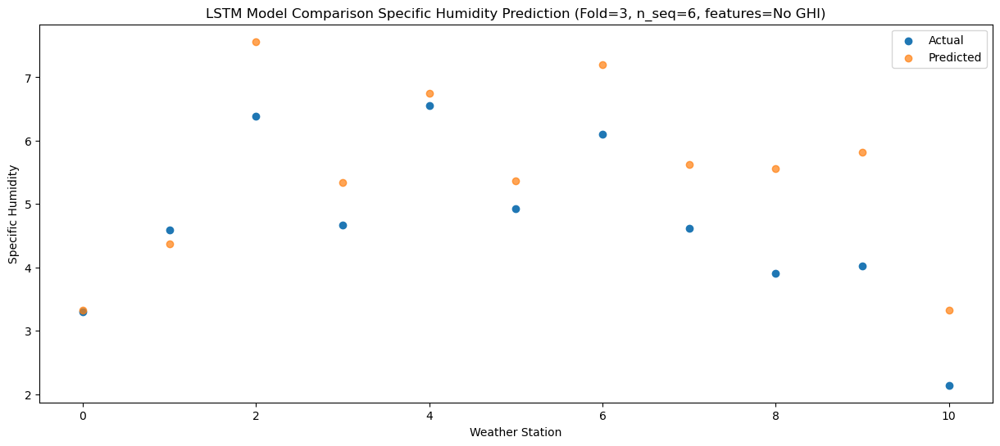

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   4.427124
1                 1    5.76   5.467124
2                 2    7.01   8.667124
3                 3    5.86   6.447124
4                 4    7.62   7.847124
5                 5    6.23   6.467124
6                 6    6.57   8.297124
7                 7    4.31   6.727124
8                 8    4.83   6.667124
9                 9    5.40   6.917124
10               10    3.55   4.427124


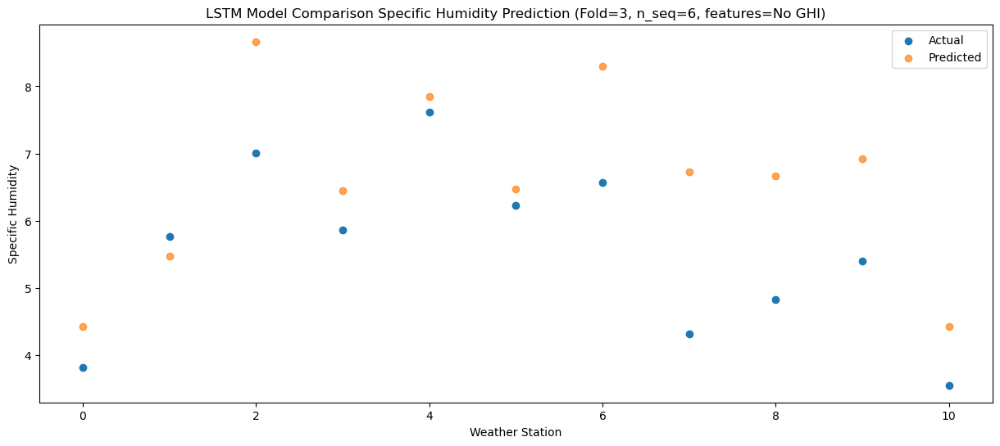

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   6.659256
1                 1    9.28   7.699256
2                 2    7.41  10.899256
3                 3    8.39   8.679256
4                 4   10.04  10.079256
5                 5    8.47   8.699256
6                 6    7.97  10.529256
7                 7    4.87   8.959256
8                 8    5.27   8.899256
9                 9    6.97   9.149256
10               10    5.14   6.659256


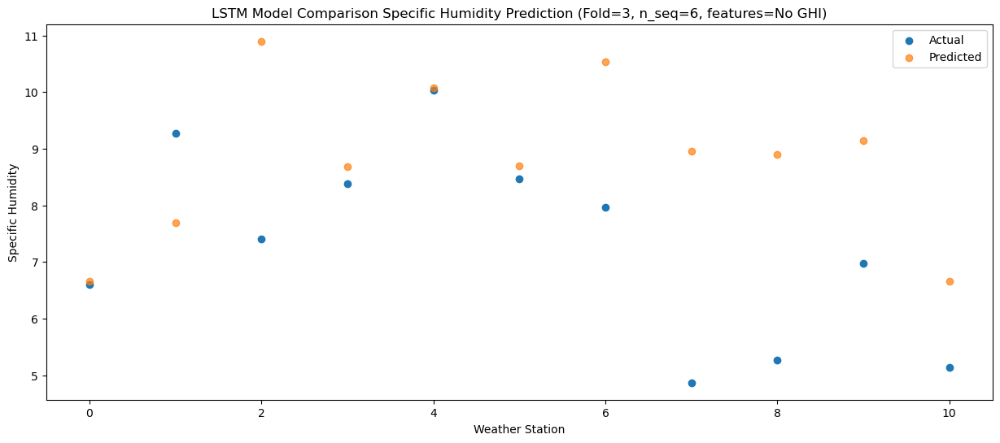

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  11.276897
1                 1   13.81  12.316897
2                 2    9.86  15.516897
3                 3   13.81  13.296897
4                 4   14.50  14.696897
5                 5   13.69  13.316897
6                 6    9.30  15.146897
7                 7    6.29  13.576897
8                 8    6.70  13.516897
9                 9   11.87  13.766897
10               10   10.01  11.276897


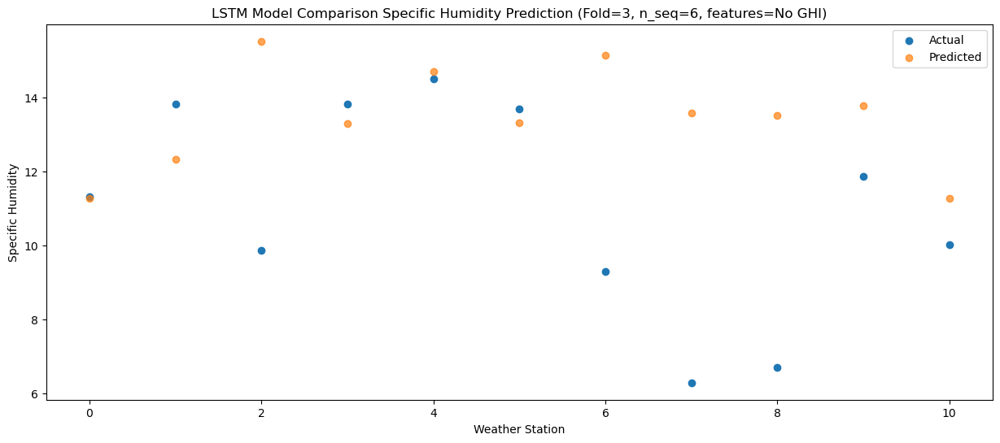

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1006 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1006 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1007 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1007 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1509 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1510 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1511 (Dense)          (1, 6)                 

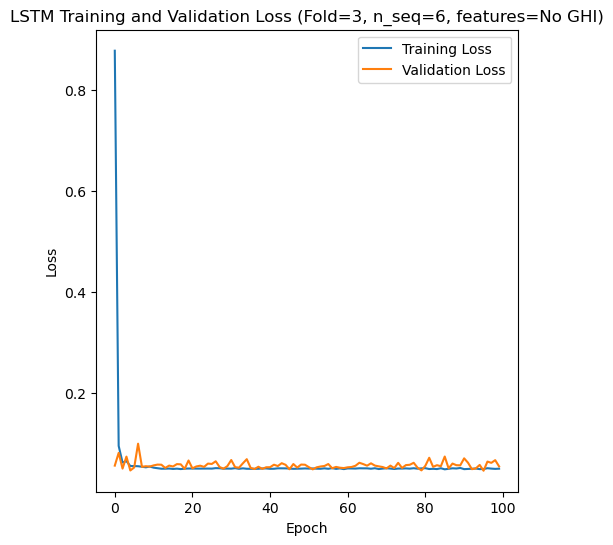

Epoch 1/100
84/84 [==============================] - 39s 274ms/step - loss: 0.7616 - val_loss: 0.1351
Epoch 2/100
84/84 [==============================] - 19s 230ms/step - loss: 0.0787 - val_loss: 0.0460
Epoch 3/100
84/84 [==============================] - 21s 246ms/step - loss: 0.0656 - val_loss: 0.0623
Epoch 4/100
84/84 [==============================] - 21s 248ms/step - loss: 0.0599 - val_loss: 0.0469
Epoch 5/100
84/84 [==============================] - 21s 254ms/step - loss: 0.0601 - val_loss: 0.0486
Epoch 6/100
84/84 [==============================] - 23s 269ms/step - loss: 0.0552 - val_loss: 0.0517
Epoch 7/100
84/84 [==============================] - 22s 267ms/step - loss: 0.0563 - val_loss: 0.0450
Epoch 8/100
84/84 [==============================] - 22s 260ms/step - loss: 0.0549 - val_loss: 0.0534
Epoch 9/100
84/84 [==============================] - 25s 297ms/step - loss: 0.0566 - val_loss: 0.0443
Epoch 10/100
84/84 [==============================] - 25s 299ms/step - loss: 0.054

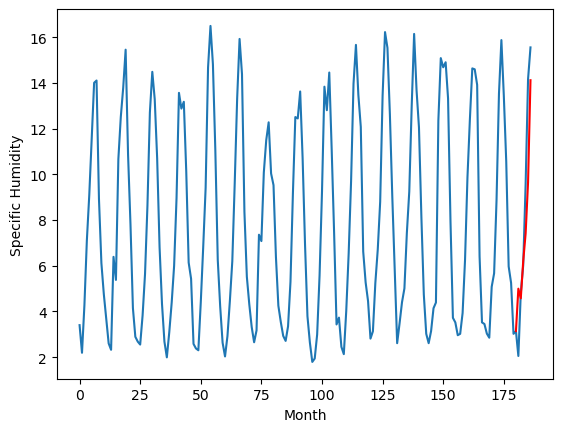

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.70		-0.57
6.26		3.27		-2.99
6.23		4.90		-1.33
6.98		6.11		-0.87
8.31		8.36		0.05
12.60		12.82		0.22
[180, 181, 182, 183, 184, 185, 186]
[7.79, 3.696143193244934, 3.2749984395503997, 4.898304356336594, 6.112109078168869, 8.359084738492966, 12.823010100126266]


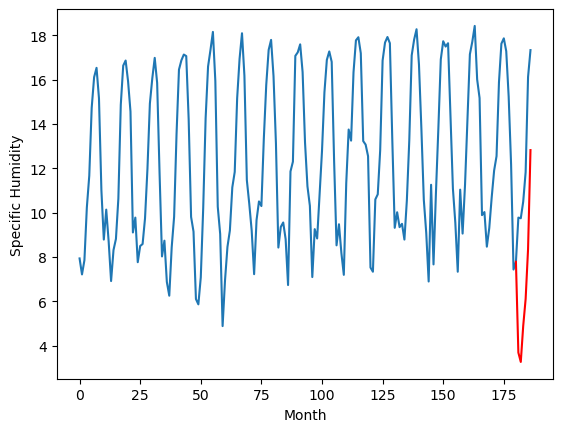

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.76		-0.11
3.75		3.33		-0.42
6.81		4.96		-1.85
7.06		6.17		-0.89
10.50		8.42		-2.08
14.74		12.88		-1.86
[180, 181, 182, 183, 184, 185, 186]
[5.03, 3.756143193244934, 3.3349984395503998, 4.958304356336594, 6.1721090781688694, 8.419084738492966, 12.883010100126267]


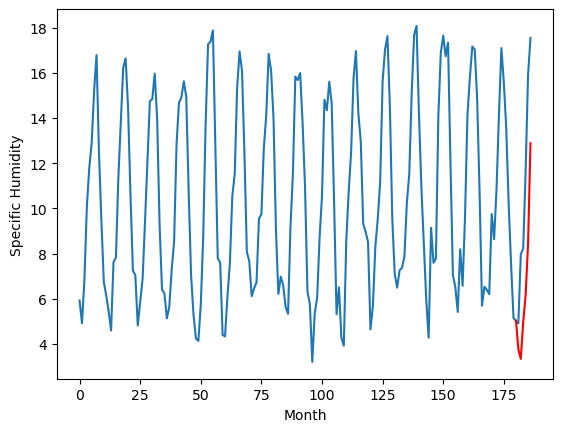

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.62		-0.11
3.41		3.19		-0.22
6.07		4.82		-1.25
7.36		6.03		-1.33
11.36		8.28		-3.08
15.05		12.74		-2.31
[180, 181, 182, 183, 184, 185, 186]
[4.41, 3.616143193244934, 3.1949984395503996, 4.8183043563365935, 6.032109078168869, 8.279084738492966, 12.743010100126266]


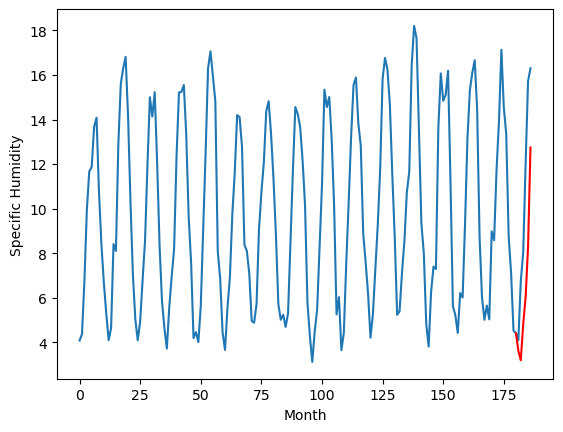

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.18		-0.18
2.91		2.75		-0.16
5.49		4.38		-1.11
6.85		5.59		-1.26
11.14		7.84		-3.30
15.02		12.30		-2.72
[180, 181, 182, 183, 184, 185, 186]
[4.29, 3.176143193244934, 2.7549984395503997, 4.378304356336594, 5.592109078168869, 7.839084738492966, 12.303010100126267]


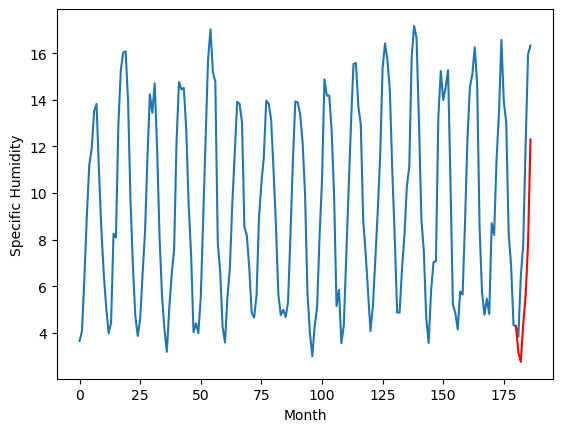

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.72		-0.92
8.00		7.29		-0.71
9.49		8.92		-0.57
10.45		10.13		-0.32
15.00		12.38		-2.62
17.30		16.84		-0.46
[180, 181, 182, 183, 184, 185, 186]
[3.47, 7.7161431932449345, 7.2949984395504, 8.918304356336595, 10.13210907816887, 12.379084738492967, 16.843010100126268]


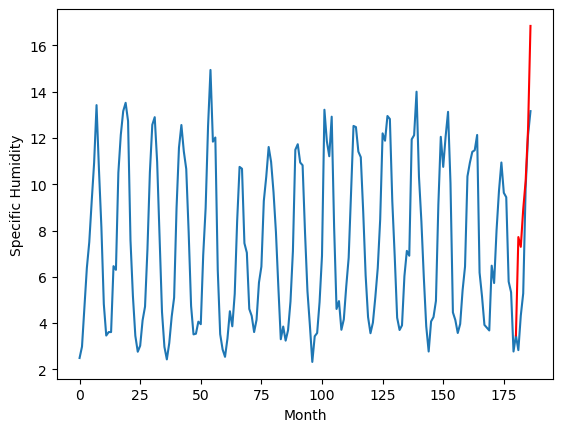

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.70		-0.10
6.05		5.27		-0.78
7.76		6.90		-0.86
8.17		8.11		-0.06
11.15		10.36		-0.79
15.84		14.82		-1.02
[180, 181, 182, 183, 184, 185, 186]
[4.52, 5.696143193244934, 5.2749984395504, 6.898304356336594, 8.112109078168869, 10.359084738492966, 14.823010100126266]


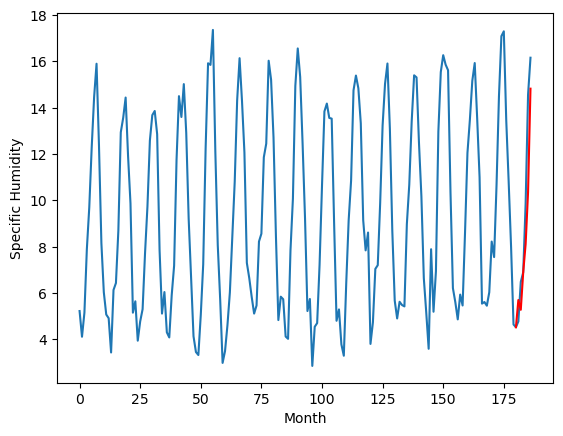

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.86		-0.07
3.30		3.43		0.13
5.67		5.06		-0.61
6.59		6.27		-0.32
9.75		8.52		-1.23
14.35		12.98		-1.37
[180, 181, 182, 183, 184, 185, 186]
[3.4, 3.856143193244934, 3.4349984395504, 5.058304356336594, 6.272109078168869, 8.519084738492966, 12.983010100126267]


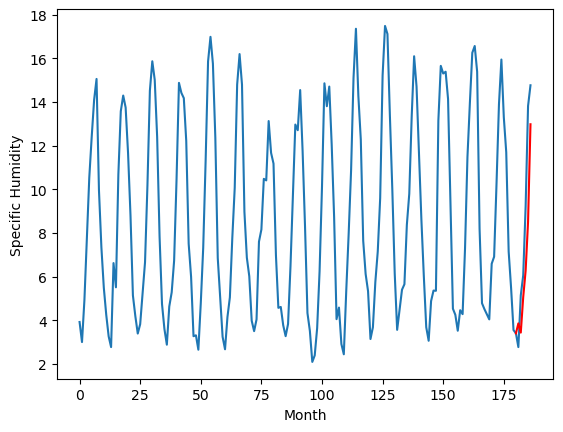

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.43		0.13
2.73		3.00		0.27
4.67		4.63		-0.04
6.00		5.84		-0.16
8.29		8.09		-0.20
13.35		12.55		-0.80
[180, 181, 182, 183, 184, 185, 186]
[2.82, 3.426143193244934, 3.0049984395503997, 4.628304356336594, 5.842109078168869, 8.089084738492966, 12.553010100126267]


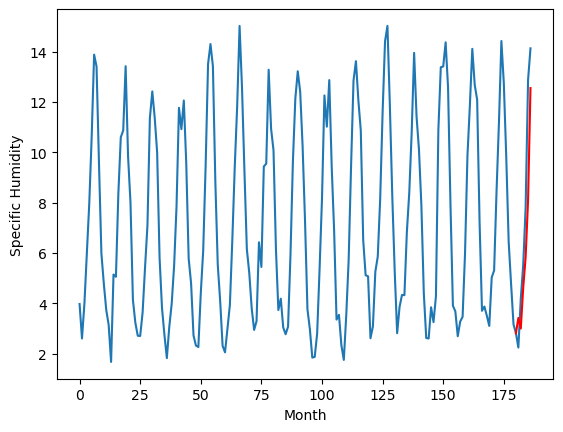

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.27		0.10
1.53		1.84		0.31
3.90		3.47		-0.43
5.21		4.68		-0.53
7.83		6.93		-0.90
12.58		11.39		-1.19
[180, 181, 182, 183, 184, 185, 186]
[2.86, 2.2661431932449343, 1.8449984395504, 3.468304356336594, 4.682109078168869, 6.929084738492966, 11.393010100126267]


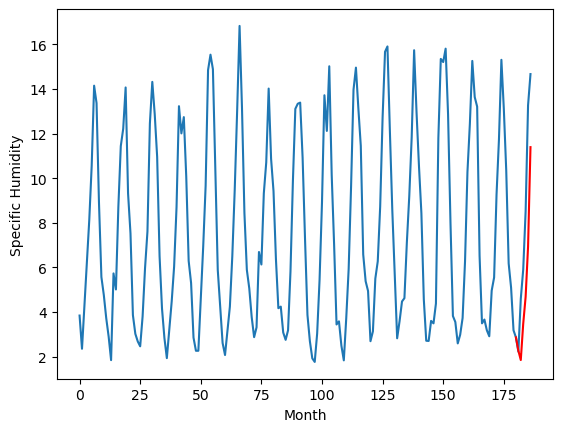

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.00		0.16
4.27		4.57		0.30
5.56		6.20		0.64
7.23		7.41		0.18
8.83		9.66		0.83
13.84		14.12		0.28
[180, 181, 182, 183, 184, 185, 186]
[2.61, 4.996143193244934, 4.5749984395503995, 6.198304356336593, 7.412109078168869, 9.659084738492965, 14.123010100126265]


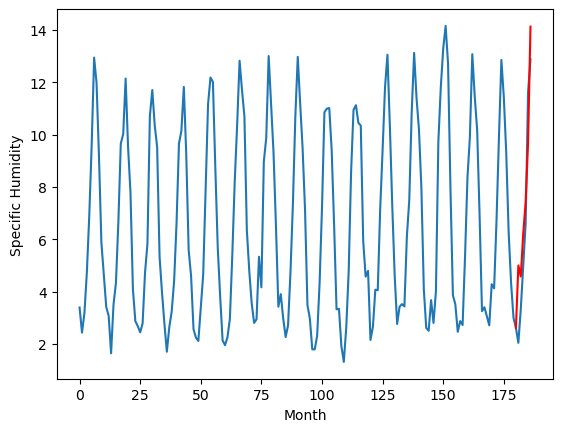

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[4.996143193244934, 3.696143193244934, 3.756143193244934, 3.616143193244934, 3.176143193244934, 7.7161431932449345, 5.696143193244934, 3.856143193244934, 3.426143193244934, 2.2661431932449343, 4.996143193244934]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   4.996143
1                 1    4.27   3.696143
2                 2    3.87   3.756143
3                 3    3.73   3.616143
4                 4    3.36   3.176143
5                 5    8.64   7.716143
6                 6    5.80   5.696143
7                 7    3.93   3.856143
8                 8    3.30   3.426143
9                 9    2.17   2.266143
10               10    4.84   4.996143


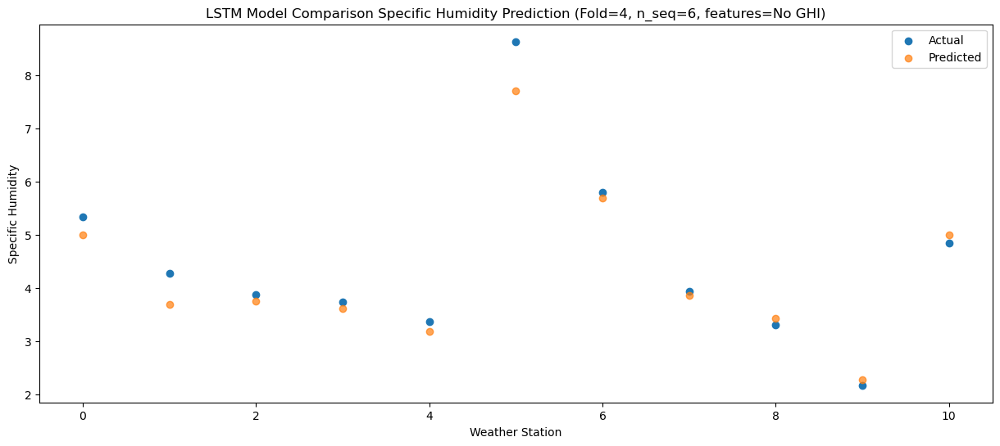

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.574998
1                 1    6.26   3.274998
2                 2    3.75   3.334998
3                 3    3.41   3.194998
4                 4    2.91   2.754998
5                 5    8.00   7.294998
6                 6    6.05   5.274998
7                 7    3.30   3.434998
8                 8    2.73   3.004998
9                 9    1.53   1.844998
10               10    4.27   4.574998


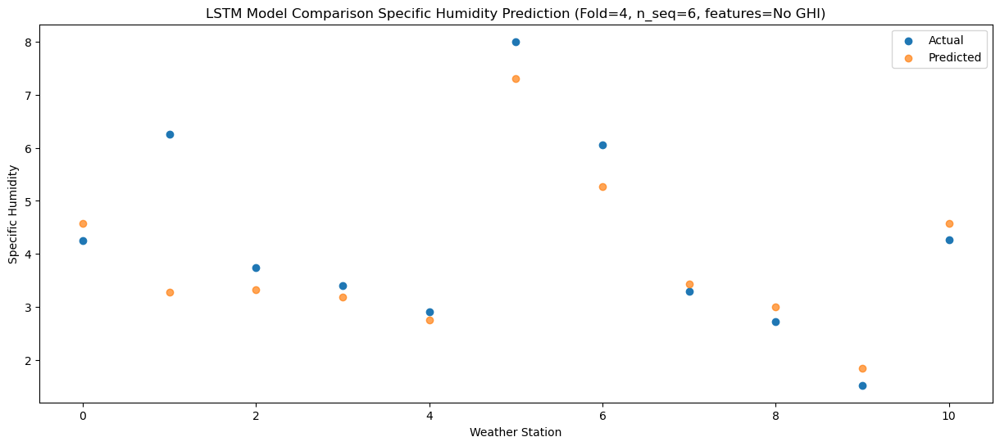

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   6.198304
1                 1    6.23   4.898304
2                 2    6.81   4.958304
3                 3    6.07   4.818304
4                 4    5.49   4.378304
5                 5    9.49   8.918304
6                 6    7.76   6.898304
7                 7    5.67   5.058304
8                 8    4.67   4.628304
9                 9    3.90   3.468304
10               10    5.56   6.198304


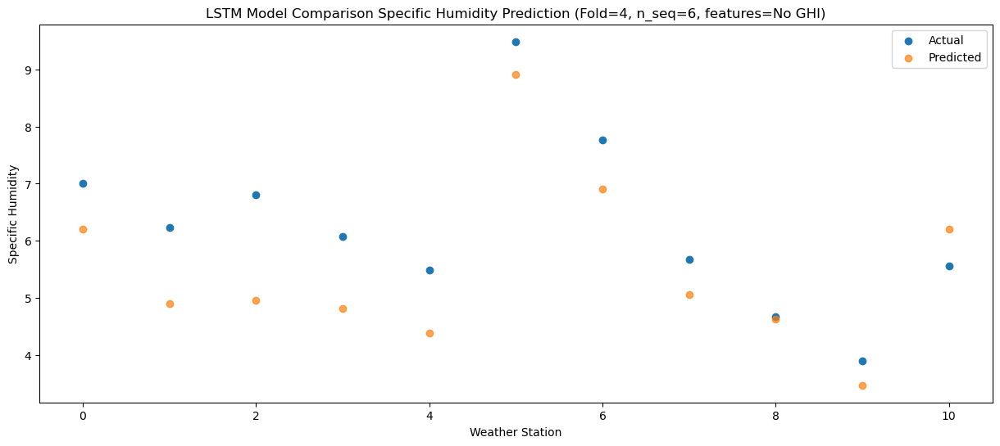

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   7.412109
1                 1    6.98   6.112109
2                 2    7.06   6.172109
3                 3    7.36   6.032109
4                 4    6.85   5.592109
5                 5   10.45  10.132109
6                 6    8.17   8.112109
7                 7    6.59   6.272109
8                 8    6.00   5.842109
9                 9    5.21   4.682109
10               10    7.23   7.412109


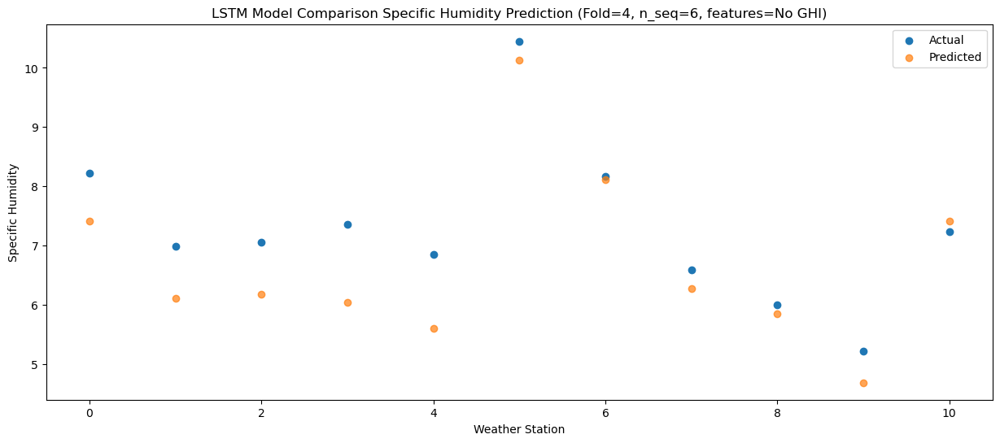

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78   9.659085
1                 1    8.31   8.359085
2                 2   10.50   8.419085
3                 3   11.36   8.279085
4                 4   11.14   7.839085
5                 5   15.00  12.379085
6                 6   11.15  10.359085
7                 7    9.75   8.519085
8                 8    8.29   8.089085
9                 9    7.83   6.929085
10               10    8.83   9.659085


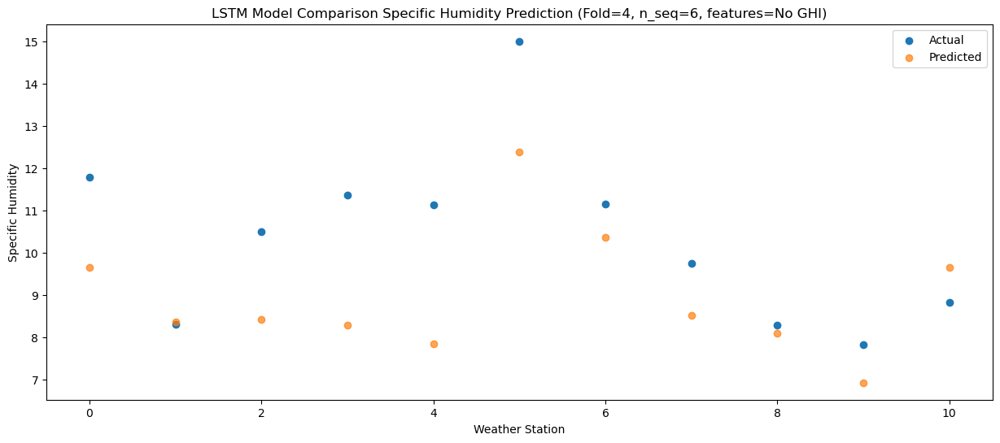

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37   14.12301
1                 1   12.60   12.82301
2                 2   14.74   12.88301
3                 3   15.05   12.74301
4                 4   15.02   12.30301
5                 5   17.30   16.84301
6                 6   15.84   14.82301
7                 7   14.35   12.98301
8                 8   13.35   12.55301
9                 9   12.58   11.39301
10               10   13.84   14.12301


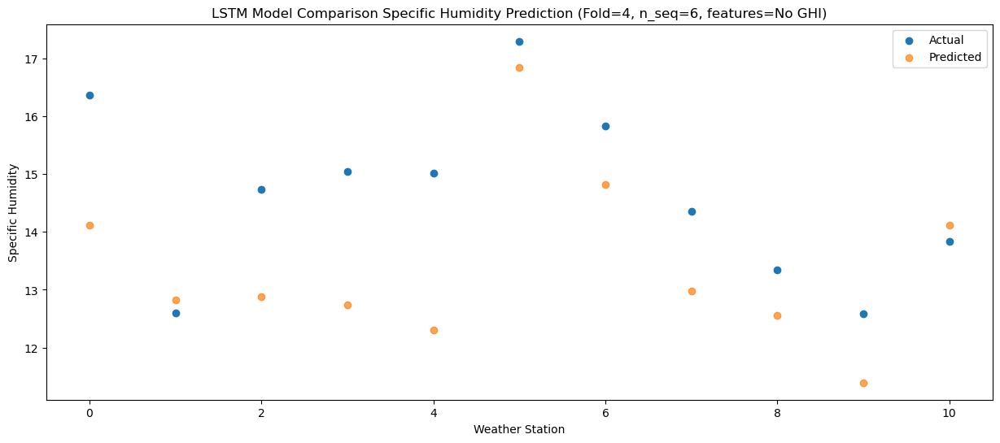

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1008 (LSTM)            (1, 1, 256)               2279424   
                                                                 
 dropout_1008 (Dropout)      (1, 1, 256)               0         
                                                                 
 lstm_1009 (LSTM)            (1, 256)                  525312    
                                                                 
 dropout_1009 (Dropout)      (1, 256)                  0         
                                                                 
 dense_1512 (Dense)          (1, 256)                  65792     
                                                                 
 dense_1513 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1514 (Dense)          (1, 6)                 

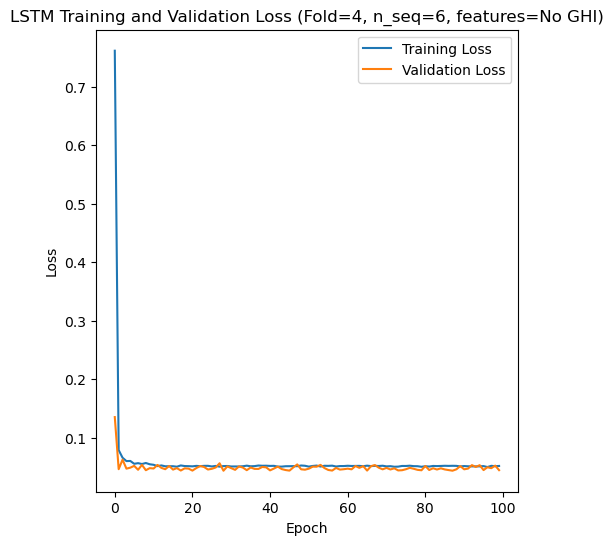

[[0.34421469835838797, 0.7422098155040603, 1.536221774280365, 1.1903271390011798, 2.349811951593631, 2.4033186184656263], [0.3796216050299702, 0.49440956877511333, 0.7774209493774106, 0.7304616890095977, 1.6253615499881884, 1.0618349416147685], [0.48423492283107944, 1.1963919159613412, 1.5703903774680417, 1.467514644618055, 2.7928864027904794, 2.5359112948984928], [0.5390083813449127, 0.5612699879016049, 1.032496983759873, 1.3116413840669774, 2.30247979101807, 3.9729924419484948], [0.3601221999288032, 0.98359670023889, 0.986394168359419, 0.7435834167576357, 1.9013935676492435, 1.5517540622946178]]
[[0.24935128699649434, 0.5678480746529314, 1.309489613446322, 0.9930965115807269, 2.041210872910239, 2.2372444425929667], [0.28517995234240195, 0.4127459649741651, 0.6756445824964484, 0.6201066426661883, 1.2962408036399964, 0.8674231413142253], [0.3373770942471242, 0.8254064946824852, 1.369280631217089, 1.2485089225118804, 2.3570084002884943, 2.152130249305205], [0.41748676132072104, 0.510773

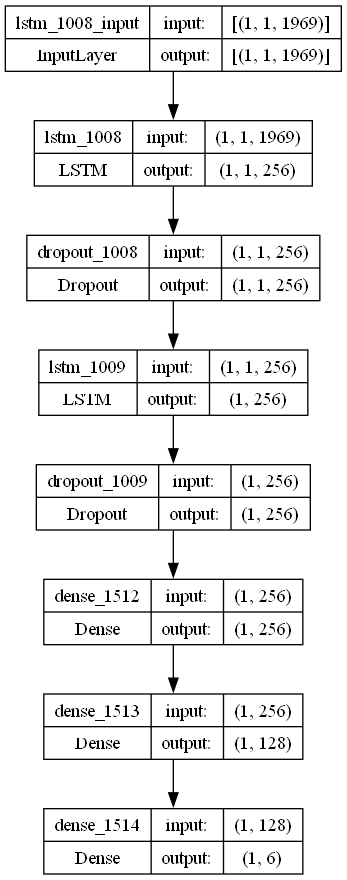

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# make one forecast with an LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S6_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

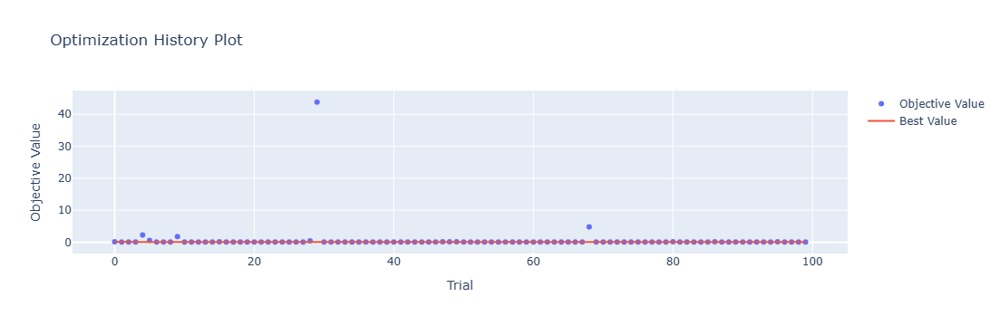

In [4]:
optuna.visualization.plot_optimization_history(study)

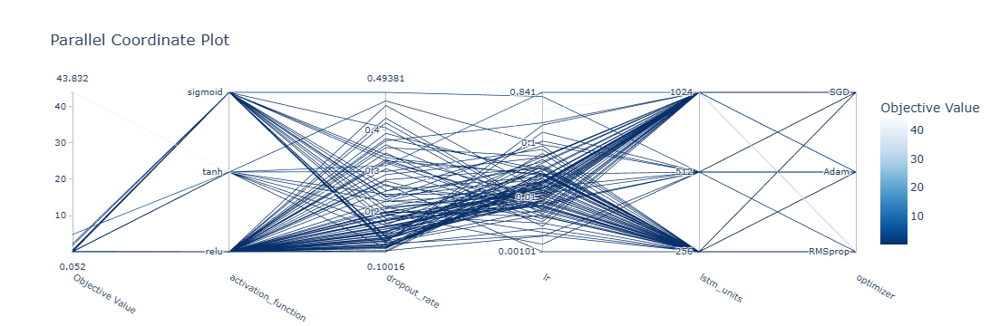

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

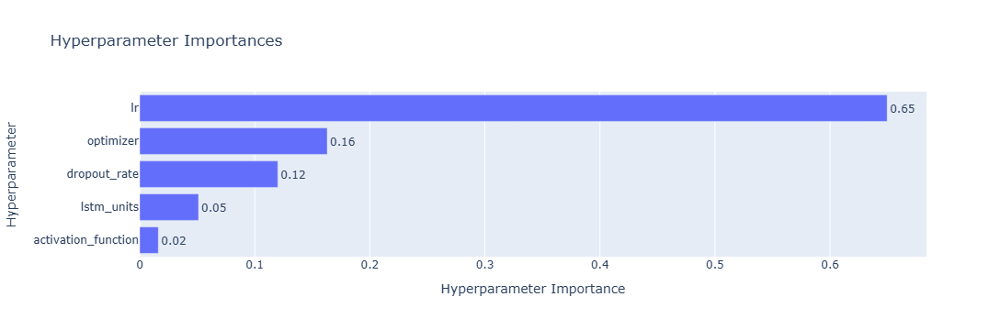

In [6]:
optuna.visualization.plot_param_importances(study)

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.013829525967736797
    optimizer = RMSprop(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 256
    dropout_rate = 0.13094162546276442

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with an LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S12_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

Epoch 1/100
84/84 [==============================] - 21s 138ms/step - loss: 1.8714 - accuracy: 0.5714 - mae: 1.7620 - rmse: 1.8714 - mape: 318.0040 - pearson: 0.5368 - val_loss: 0.0595 - val_accuracy: 0.8000 - val_mae: 0.0499 - val_rmse: 0.0595 - val_mape: 8.5155 - val_pearson: 0.8329
Epoch 2/100
84/84 [==============================] - 12s 138ms/step - loss: 0.0680 - accuracy: 0.7143 - mae: 0.0548 - rmse: 0.0680 - mape: 9.1922 - pearson: 0.7116 - val_loss: 0.0642 - val_accuracy: 0.8000 - val_mae: 0.0526 - val_rmse: 0.0642 - val_mape: 9.2010 - val_pearson: 0.7821
Epoch 3/100
84/84 [==============================] - 11s 127ms/step - loss: 0.0664 - accuracy: 0.7143 - mae: 0.0550 - rmse: 0.0664 - mape: 9.2835 - pearson: 0.7035 - val_loss: 0.0602 - val_accuracy: 0.8000 - val_mae: 0.0521 - val_rmse: 0.0602 - val_mape: 8.9800 - val_pearson: 0.6872
Epoch 4/100
84/84 [==============================] - 11s 127ms/step - loss: 0.0654 - accuracy: 0.7262 - mae: 0.0535 - rmse: 0.0654 - mape: 9.0391 


KeyboardInterrupt



In [ ]:
from matplotlib import pyplot

n_test_batch = 11
ws=0

# make forecasts
forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test_batch)

# inverse transform forecasts and test
forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
actual = [row[-n_seq:] for row in test1]
actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

rmse_list = [] # list stores root mean squared errors for each future time prediction
mae_list = [] # list stores root mean squared errors for each future time prediction
mape_list = [] # list stores root mean squared errors for each future time prediction
r2_list = [] # list stores root mean squared errors for each future time prediction
    
# evaluate forecasts
rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

# plot forecasts
dataset_df = pd.DataFrame(val_y[0])
dataset_df = dataset_df.iloc[0:11, :]
dataset_df = dataset_df.transpose()
dataset = dataset_df.values

#print(dataset_df)

#print(len(dataset))
#print(dataset)


series_ws = pd.Series(dataset[:, ws]) # Using first column (specific_humidity)
forecasts_ws = [forecasts[ws]]

print(series_ws[180:225])
print(actual[0])
print(forecasts[0])

n_test=11
print(len(series_ws))
print(series_ws[220:228])
print(len(forecasts_ws))
print(forecasts_ws)
print(n_seq)
print(n_test)

# plot forecasts
plot_forecasts(series_ws, forecasts_ws, n_test+2)

In [ ]:
# Extract the dates corresponding to the test set predictions
test_dates = df.index[-len(actual[0]):]

# Print out plots of actual and predicted values for each weather station
for j in range(11):
    print("Weather Station "+str(j+1)+":")
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'Month': test_dates,
        'Actual': actual[j],
        'Predicted': forecasts[j]
    })
            
    # Plotting the results
    plt.figure(figsize=(15, 6))
    plt.plot(results_df['Month'], results_df['Actual'], label='Actual')
    plt.plot(results_df['Month'], results_df['Predicted'], label='Predicted', alpha=0.7)
    plt.title('LSTM Model Comparison Specific Humidity Prediction')
    plt.xlabel('Month')
    plt.ylabel('Specific Humidity')
    plt.legend()
    plt.show()

    # Plot model architecture
    filename = "lstm_model_optimized_ws_"+str(j)+".png"
    plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

In [ ]:
print(np.mean(rmse))
print(np.std(rmse))

In [ ]:
print(len(actual))
print(len(actual[0]))
print(len(forecasts))
print(len(forecasts[0]))